In [92]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pprint
sns.set(style="white", context='poster')
import math
from scipy.integrate import solve_ivp

In [93]:
%load_ext autoreload
%autoreload 2


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [94]:
#from model_equations_separate_NC import *
from model_equations_separate_NC_store_numba import *


In [95]:
morder = ['MIN', 'OVERFLOW', 'MIXOTROPH', 'EXOENZYME', 'ROS',]
media_order = ['lowN', 'pro99']
mpalette = 'twilight'
sns.color_palette(mpalette, n_colors=5)


[(0.4828677867260272, 0.6304330455306234, 0.761915371498953),
 (0.3668108554010799, 0.26404857724525643, 0.6464799165290824),
 (0.18488035509396164, 0.07942573027972388, 0.21307651648984993),
 (0.5566322903496934, 0.17269677158182117, 0.31423043195101424),
 (0.775907907306857, 0.5355421788246119, 0.42413367909988375)]

In [96]:

HCOLOR = '#ffc58f'
HCOLOR_light = '#ffd2a9'
PCOLOR = '#99cc99'
PCOLOR_light = '#aad5aa'

DONCOLOR = '#7285b7'
RDONCOLOR = 'black' #'#00334D'
DINCOLOR = '#bbdaff' #'#000066'

DOCCOLOR = '#cc6666'
RDOCCOLOR = 'black' #'#00334D'
DICCOLOR = '#ff9da4' #'#000066'

SHCOLOR = '#ffa98f'
SPCOLOR = '#326232'


ccnpalette = [PCOLOR, PCOLOR_light, HCOLOR, HCOLOR_light, SPCOLOR, SHCOLOR,DONCOLOR, RDONCOLOR, DINCOLOR]
ccnorder = ['Bp', 'Np', 'Bh','Nh',  'ABp', 'ABh', 'DON', 'RDON', 'DIN', ]
cccpalette = [PCOLOR, PCOLOR_light, HCOLOR, HCOLOR_light, SPCOLOR, SHCOLOR, DOCCOLOR, RDOCCOLOR, DICCOLOR]
cccorder = ['Bp[C]', 'Cp', 'Bh[C]', 'Ch', 'ABp[C]', 'ABh[C]', 'DOC', 'RDOC', 'DIC']
ccxpalette = [PCOLOR, HCOLOR]
ccxorder = ['Xp', 'Xh']
hnpalette = [ HCOLOR_light, SPCOLOR, SHCOLOR, DONCOLOR, RDONCOLOR, DINCOLOR]
hnorder = [ 'Bh', 'ABp', 'ABh', 'DON', 'RDON', 'DIN']
hcpalette = [ HCOLOR_light, SPCOLOR, SHCOLOR, DOCCOLOR, RDOCCOLOR, DICCOLOR]
hcorder = [ 'Bh[C]', 'ABp[C]', 'ABh[C]', 'DOC', 'RDOC', 'DIC']
pnpalette = [ PCOLOR_light, SPCOLOR, SHCOLOR, DONCOLOR, RDONCOLOR, DINCOLOR]
pnorder = [ 'Bp', 'ABp', 'ABh', 'DON', 'RDON', 'DIN']
pcpalette = [ PCOLOR_light, SPCOLOR, SHCOLOR, DOCCOLOR, RDOCCOLOR, DICCOLOR]
pcorder = [ 'Bp[C]', 'ABp[C]', 'ABh[C]', 'DOC', 'RDOC', 'DIC']
sns.color_palette(ccnpalette + cccpalette, )
# 


[(0.6, 0.8, 0.6),
 (0.6666666666666666, 0.8352941176470589, 0.6666666666666666),
 (1.0, 0.7725490196078432, 0.5607843137254902),
 (1.0, 0.8235294117647058, 0.6627450980392157),
 (0.19607843137254902, 0.3843137254901961, 0.19607843137254902),
 (1.0, 0.6627450980392157, 0.5607843137254902),
 (0.4470588235294118, 0.5215686274509804, 0.7176470588235294),
 (0.0, 0.0, 0.0),
 (0.7333333333333333, 0.8549019607843137, 1.0),
 (0.6, 0.8, 0.6),
 (0.6666666666666666, 0.8352941176470589, 0.6666666666666666),
 (1.0, 0.7725490196078432, 0.5607843137254902),
 (1.0, 0.8235294117647058, 0.6627450980392157),
 (0.19607843137254902, 0.3843137254901961, 0.19607843137254902),
 (1.0, 0.6627450980392157, 0.5607843137254902),
 (0.8, 0.4, 0.4),
 (0.0, 0.0, 0.0),
 (1.0, 0.615686274509804, 0.6431372549019608)]

In [97]:
plt.rcParams['figure.dpi']= 300

In [98]:

 
sns.color_palette([PCOLOR, HCOLOR, PCOLOR_light, HCOLOR_light] )


[(0.6, 0.8, 0.6),
 (1.0, 0.7725490196078432, 0.5607843137254902),
 (0.6666666666666666, 0.8352941176470589, 0.6666666666666666),
 (1.0, 0.8235294117647058, 0.6627450980392157)]

In [99]:
refdf = pd.read_excel('reference_10cc_axenic.xlsx')
refp99df = pd.read_excel('reference_pro99_axenic.xlsx')


In [100]:
dpath = '/fast_data/Osnat/RECYCLE_MODEL/results/shgo2/out'
dpath = 'results'

In [101]:
os.listdir(dpath)

['monte_ponly_clean_mse.csv.gz',
 'monte2_ponly_sum.csv.gz',
 'sensitivity_vmax2_df.csv.gz',
 'monte_ponly_clean_df.csv.gz',
 'monte_het_minmse.csv.gz',
 'sensitivity_df.csv.gz',
 'default_initial_lowN_ponly_MIN_h4139617574487472499_sum.csv.gz',
 'monte_ponly_df.csv.gz',
 'default_initial_lowN_ponly_MIN_h4139617574487472499_mse.csv.gz',
 'default_initial_lowN_ponly_MIN_h4139617574487472499_df.csv.gz',
 'baseline_df.csv.gz',
 'results_old_26122023',
 'monte_het_clean_sum.csv.gz',
 'baseline_sum.csv.gz',
 'monte_strong_ponly_clean_df.csv.gz',
 'sensitivity_vmax2_sum.csv.gz',
 'monte_strong_ponly_sum.csv.gz',
 'sensitivity_vmax_mse.csv.gz',
 'monte_ponly_mse.csv.gz',
 'monte_ponly_sum.csv.gz',
 'monte_het_clean_mse.csv.gz',
 'monte_strong_ponly_df.csv.gz',
 'sensitivity_sum.csv.gz',
 'sensitivity_vmax2_mse.csv.gz',
 'sensitivity_vmax_df.csv.gz',
 'monte_het_mse.csv.gz',
 'monte_strong_ponly_clean_sum.csv.gz',
 'monte_het_sum.csv.gz',
 'monte_strong_ponly_mse.csv.gz',
 'monte_ponly_clean_s

In [102]:
pro99_mode = False 
which_organism = 'ponly'
organism_to_tune = 'PRO'
(var_names, init_var_vals, intermediate_names, calc_dydt, prepare_params_tuple
) = get_constants_per_organism(pro99_mode, which_organism)
for model in ['OVERFLOW', 'MIXOTROPH', 'ROS', 'MIN', 'EXOENZYME']:
    params_to_update, bounds, log_params = get_param_tuning_values(model, organism_to_tune)
    


In [103]:
df = pd.read_csv(os.path.join(dpath,'monte_strong_ponly_clean_df.csv.gz',))
mse_df = pd.read_csv(os.path.join(dpath,'monte_strong_ponly_clean_mse.csv.gz',))
sum_df = pd.read_csv(os.path.join(dpath,'monte_strong_ponly_clean_sum.csv.gz',))

In [104]:
sum_df.run_id.head().unique()

array(['monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1__monte__56_lowN_ponly_EXOENZYME_h7074824497105437591',
       'monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1__monte__41_pro99_ponly_EXOENZYME_h7074824497105437591',
       'monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1__monte__67_lowN_ponly_EXOENZYME_h7074824497105437591',
       'monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1__monte__5_lowN_ponly_EXOENZYME_h7074824497105437591',
       'monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1__monte__12_pro99_ponly_EXOENZYME_h7074824497105437591'],
      dtype=object)

In [105]:
sum_df[['id', 'media', 'which', 'model', 'hash']] = sum_df.run_id.str.rsplit('_', n=4, expand=True)
mse_df[['id', 'media', 'which', 'model', 'hash']] = mse_df.run_id.str.rsplit('_', n=4, expand=True)
df    [['id', 'media', 'which', 'model', 'hash']] =     df.run_id.str.rsplit('_', n=4, expand=True)

sum_df['idx'] = sum_df['id'] + '_' + sum_df['model']
mse_df['idx'] = mse_df['id'] + '_' + mse_df['model']
df    ['idx'] =     df['id'] + '_' +     df['model']

In [106]:
mse_df['RMSE'] = np.sqrt(mse_df['RMSE'])

In [107]:
mse_df.groupby('media').compare_points.describe()

,count,mean,std,min,25%,50%,75%,max
media,,,,,,,,
lowN,10806.0,74.0,0.0,74.0,74.0,74.0,74.0,74.0
pro99,10806.0,58.0,0.0,58.0,58.0,58.0,58.0,58.0


In [108]:
mse_df['ref_compare_points'] = mse_df.media.map({'lowN' : 74, 'pro99': 58})
bad_ids_missing_points = set(mse_df.loc[mse_df.ref_compare_points != mse_df.compare_points, 'idx' ])
len(bad_ids_missing_points)

0

In [109]:
min_values = df[var_names+ ['idx']].groupby('idx').min().min(axis=1)
bad_ids_negative_values = set(min_values[min_values< -1e-9].index)
len(bad_ids_negative_values)

0

In [110]:
min_values

idx
monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1__monte__0_EXOENZYME     0.000000e+00
monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1__monte__10_EXOENZYME    0.000000e+00
monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1__monte__11_EXOENZYME    0.000000e+00
monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1__monte__12_EXOENZYME   -3.300942e-23
monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1__monte__13_EXOENZYME    0.000000e+00
                                                                           ...     
monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__96_ROS                     0.000000e+00
monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__97_ROS                     0.000000e+00
monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__98_ROS                    -3.454873e-22
monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__99_ROS                     0.000000e+00
monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__9_ROS                      0.000000e+00
Length: 3602, dtype: float64

In [111]:
bad_ids = bad_ids_missing_points | bad_ids_negative_values
len(bad_ids)

0

In [112]:
mse_df = mse_df.loc[~mse_df.idx.isin(bad_ids)].copy()
sum_df = sum_df.loc[~sum_df.idx.isin(bad_ids)].copy()
df     =     df.loc[    ~df.idx.isin(bad_ids)].copy()


In [113]:
sum_df.idx.nunique()

3602

In [114]:
# represent FL 0.1
NBIOMASS_LOD_NOT_GROWING = 2.34502821

In [115]:
mse_df.groupby('media')[['RMSE']].describe().T

media               lowN         pro99
RMSE count  10806.000000  10806.000000
     mean      49.787536    319.983837
     std       37.181362    341.698542
     min        7.694535     59.898778
     25%       32.445857    132.441046
     50%       33.596434    140.429324
     75%       51.108853    364.915644
     max      186.985899   1533.520418

In [116]:
#mse_df['RMSE'] = mse_df['RMSE'].clip(upper=1e5)

In [117]:
sum_df['model'].value_counts()

EXOENZYME    5214
ROS          1990
Name: model, dtype: int64

In [118]:
#mean_scores_1 = mse_df.groupby(['model', 'idx', 'media'], as_index=False)[['RMSE_clip', 'lRMSE_clip']].mean()
mean_scores = mse_df.pivot_table(index=['model', 'idx'], columns='media', values='RMSE' )
mean_scores
#mean_scores.columns = ['_'.join(col).strip() for col in mean_scores.columns.values]
mean_scores.rename(columns={'lowN': 'RMSE_lowN', 'pro99': 'RMSE_pro99'}, inplace=True)

mean_scores = mean_scores.reset_index()
mean_scores

media,model,idx,RMSE_lowN,RMSE_pro99
0,EXOENZYME,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,168.925566,1401.055947
1,EXOENZYME,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,74.921565,176.578563
2,EXOENZYME,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,57.698398,440.523064
3,EXOENZYME,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,33.220976,136.542373
4,EXOENZYME,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,32.990125,144.220881
...,...,...,...,...
3597,ROS,monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__96...,33.222876,136.546008
3598,ROS,monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__97...,29.623190,236.692937
3599,ROS,monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__98...,33.222876,136.546008
3600,ROS,monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__99...,21.159549,97.119431


In [119]:
mean_scores['RMSE'] = np.sqrt(mean_scores['RMSE_lowN']*  mean_scores['RMSE_pro99'])


In [120]:
mean_scores.groupby('model').describe().T

model               EXOENZYME          ROS
media                                     
RMSE_lowN  count  2607.000000   995.000000
           mean     48.617999    52.851840
           std      37.012065    37.459839
           min       8.286488     8.405606
           25%      33.166900    33.222813
           50%      33.222835    33.633144
           75%      42.192078    69.249568
           max     186.603884   171.548959
RMSE_pro99 count  2607.000000   995.000000
           mean    302.319579   366.265969
           std     335.877671   352.561173
           min      63.158692    71.537144
           25%     136.541875   136.542011
           50%     136.545880   139.762145
           75%     273.485753   541.941095
           max    1529.815554  1435.309251
RMSE       count  2607.000000   995.000000
           mean    119.309640   137.289822
           std     111.804668   115.360279
           min      29.909348    26.459194
           25%      67.347198    67.353181
           50%      67.353121    69.323160
           75%     106.193891   189.675339
           max     534.293482   496.211455

In [121]:
sns.set_context('poster')

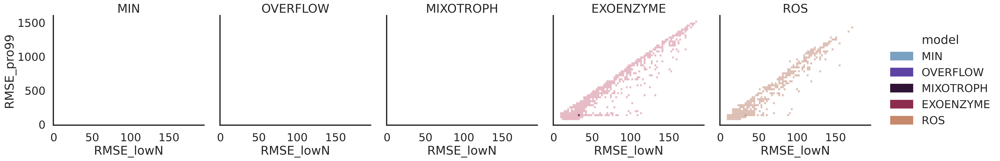

In [122]:
sns.displot(
    data=mean_scores,
    x='RMSE_lowN',  y='RMSE_pro99',
    hue='model', palette=mpalette, hue_order=morder,
    col='model', col_order=morder,
).set_titles(col_template='{col_name}', row_template='{row_name}')

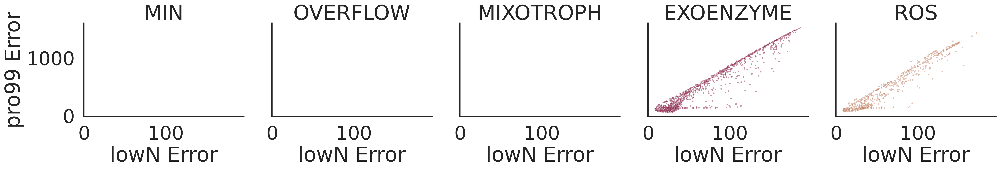

In [123]:
sns.set_context('poster',  font_scale=1.5)
g = sns.relplot(
    data=mean_scores,
    x='RMSE_lowN',  y='RMSE_pro99',
    hue='model', palette=mpalette, hue_order=morder,
    col='model', col_order=morder, #col_wrap=3,
    legend=False, s=7, alpha=0.5,
).set_titles(col_template='{col_name}', row_template='{row_name}')
g.set(xlabel='lowN Error', ylabel='pro99 Error', )
plt.savefig('figures/ponly_sobol_error.svg')

In [124]:
mean_scores

media,model,idx,RMSE_lowN,RMSE_pro99,RMSE
0,EXOENZYME,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,168.925566,1401.055947,486.491694
1,EXOENZYME,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,74.921565,176.578563,115.019748
2,EXOENZYME,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,57.698398,440.523064,159.428589
3,EXOENZYME,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,33.220976,136.542373,67.350360
4,EXOENZYME,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,32.990125,144.220881,68.977278
...,...,...,...,...,...
3597,ROS,monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__96...,33.222876,136.546008,67.353181
3598,ROS,monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__97...,29.623190,236.692937,83.735296
3599,ROS,monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__98...,33.222876,136.546008,67.353181
3600,ROS,monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__99...,21.159549,97.119431,45.332145


In [125]:
mean_scores_filtered = mean_scores.sort_values(
    by='RMSE',
)
#pmaxday_df #.loc[pmaxday_df[f'score_4'].ge(4)].copy()

In [126]:
mean_scores_filtered['lrank'] = mean_scores_filtered.groupby("model")["RMSE"].rank(method='first')
mean_scores_filtered['fit'] = 'bad'
#mean_scores_filtered.loc[mean_scores_filtered.lrank.le(100), 'fit'] = 'good'
mean_scores_filtered.loc[mean_scores_filtered.RMSE.le(60), 'fit'] = 'good'



In [127]:
mean_scores_filtered.fit.value_counts()

bad     3091
good     511
Name: fit, dtype: int64

In [128]:
bestids = mean_scores_filtered.loc[mean_scores_filtered.fit.isin(['good']), 'idx']

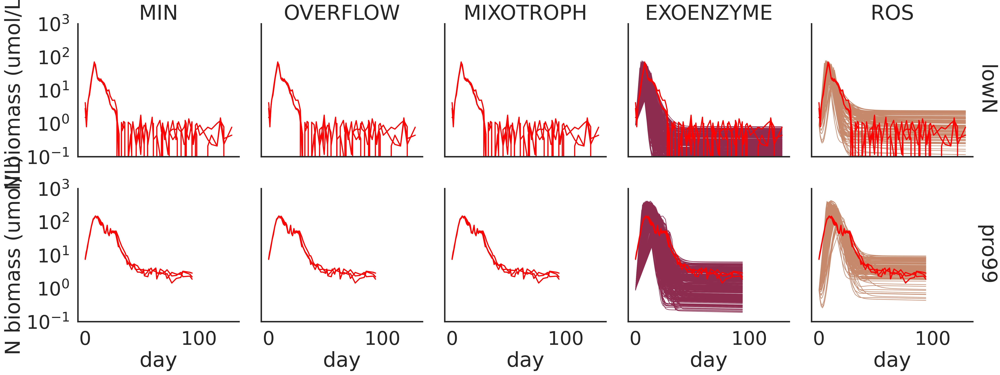

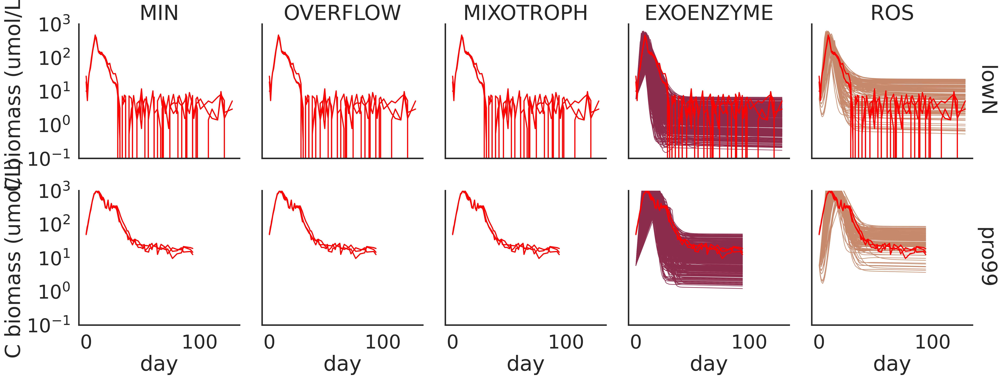

In [129]:
for n in ('N', 'C'):
    l= 'RMSE'
    g = sns.relplot(
        data=df.loc[df.idx.isin(bestids)],
        kind='line', 
        estimator=None, units='idx',
        x='day', y=f'Bptotal[{n}]', 
        row='media', row_order=media_order, lw=1,
        hue='model', hue_order=morder, palette=mpalette,
        col='model', col_order=morder, 
        facet_kws=dict( margin_titles=True),
        legend=False
    )
    for (row_val,col_val), ax in g.axes_dict.items():
        datadf = refdf if row_val == 'lowN' else refp99df
        sns.lineplot(data=datadf, x='day', y=f'ref_Bp[{n}]',
        units='Sample', estimator=None, ax=ax, lw=2, color='red',

                     legend=False
                    )
    g.set(yscale='log', ylim=(1e-1,1e3))
    g.set(ylabel=f'{n} biomass (umol/L)')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')
    #plt.suptitle(f'{n} - top models ({l})', y=1.03)

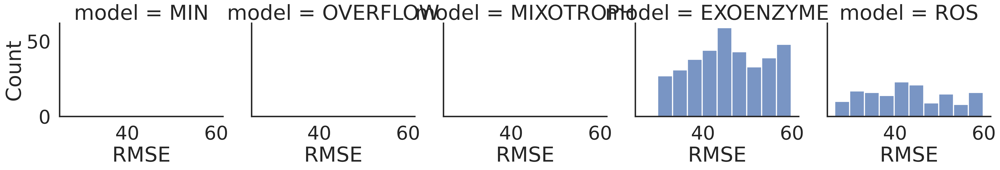

In [130]:
sns.displot(
    data=mean_scores_filtered.loc[mean_scores_filtered.fit.isin(['good'])],
    x='RMSE',
    col='model', col_order=morder,
)

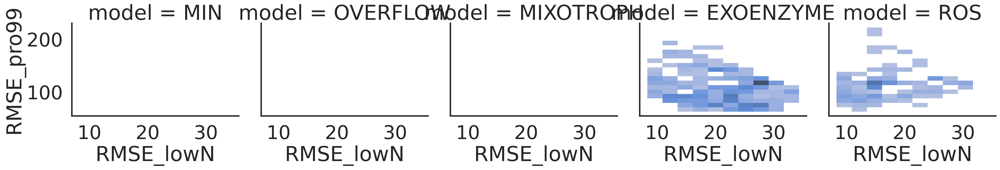

In [131]:
sns.displot(
    data=mean_scores_filtered.loc[mean_scores_filtered.fit.isin(['good'])],
    x='RMSE_lowN', y='RMSE_pro99',
    col='model', col_order=morder,
)

In [132]:
mean_scores_filtered.loc[mean_scores_filtered.idx.isin(bestids)].model.value_counts()


EXOENZYME    362
ROS          149
Name: model, dtype: int64

In [133]:
mean_scores_filtered.model.value_counts()


EXOENZYME    2607
ROS           995
Name: model, dtype: int64

In [245]:
362/2607,149/995

(0.13885692366705024, 0.14974874371859295)

In [135]:
t = mean_scores_filtered[['fit']].value_counts().reset_index()
t['%'] = 100 * t[0] / t[0].sum()
t

,fit,0,%
0,bad,3091,85.813437
1,good,511,14.186563


In [136]:
mean_scores_filtered.pivot_table(columns='fit', index='model',values='idx', aggfunc='count')

fit,bad,good
model,,
EXOENZYME,2245,362
ROS,846,149


In [137]:
min_rows = mean_scores_filtered.loc[mean_scores_filtered['fit'].isin(['good'])]
min_rows

media,model,idx,RMSE_lowN,RMSE_pro99,RMSE,lrank,fit
3506,ROS,monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__12...,9.591233,72.992588,26.459194,1.0,good
3525,ROS,monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__2_ROS,8.405606,90.183880,27.532711,2.0,good
3351,ROS,monte2_ponly_ROS_vpro_19_33_ROS_C0_7_monte__52...,8.983437,85.107058,27.650567,3.0,good
2798,ROS,monte2_ponly_ROS_vpro_19_33_ROS_C0_1_monte__93...,9.146389,84.337684,27.773824,4.0,good
3033,ROS,monte2_ponly_ROS_vpro_19_33_ROS_C0_4_monte__35...,8.941857,86.871952,27.871071,5.0,good
...,...,...,...,...,...,...,...
3404,ROS,monte2_ponly_ROS_vpro_19_33_ROS_C0_8_monte__0_ROS,20.011470,178.401446,59.750106,147.0,good
62,EXOENZYME,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,34.347821,104.199998,59.825102,361.0,good
491,EXOENZYME,monte2_ponly_EXOENZYME_vpro_24_46_EXOENZYME_C3...,24.668335,145.192772,59.847005,362.0,good
2622,ROS,monte2_ponly_ROS_vpro_19_33_ROS_C0_10_monte__2...,31.553562,113.540697,59.854936,148.0,good


### vmax per cell

uMN_per_cell = Qp = 12.5 fg/cell * 1e-9 fg->uM  / 14 (N MW)

vmax_per_sec_per_uMN = uM sec -1 uM N -1

vmax_per_day_per_uMN = vmax_per_sec_per_uMN * seconds_in_day

vmax_per_day_per_cell = vmax_per_day_per_uMN * Qp




In [138]:
#     resources* = paramkns / (paramvmax/paramM - 1)

sum_df['Vmax/K ICp'] = sum_df['VmaxICp'] / sum_df['KICp']
sum_df['Vmax/K INp'] = sum_df['VmaxINp'] / sum_df['KINp']
sum_df['R* INp'] = sum_df['KINp'] / (sum_df['VmaxINp'] / sum_df['Mp'] - 1)
sum_df['R* ICp'] = sum_df['KICp'] / (sum_df['VmaxICp'] / sum_df['Mp'] - 1)
sum_df['Vmax/Vmax Ip'] = sum_df['VmaxICp'] / sum_df['VmaxINp']



In [139]:
sum_df.columns

Index(['VmaxICp', 'VmaxICh', 'VmaxINp', 'VmaxINh', 'VmaxOCp', 'VmaxOCh',
       'VmaxONp', 'VmaxONh', 'KICp', 'KICh', 'KINp', 'KINh', 'KOCp', 'KOCh',
       'KONp', 'KONh', 'Mp', 'Mh', 'gammaDp', 'gammaDh', 'Rp', 'Rh', 'QCmaxp',
       'QCminp', 'QCmaxh', 'QCminh', 'Kmtbp', 'Kmtbh', 'bp', 'bh', 'r0p',
       'r0h', 'KdecayDON', 'KprodEXOp', 'KprodEXOh', 'OverflowMode',
       'Koverflowp', 'Koverflowh', 'ROSMode', 'KprodROSp', 'KprodROSh',
       'KlossROSp', 'KlossROSh', 'KdecayROS', 'omegaP', 'omegaH', 'ROSmaxD',
       'run_id', 'idx', 'id', 'media', 'which', 'model', 'hash', 'Vmax/K ICp',
       'Vmax/K INp', 'R* INp', 'R* ICp', 'Vmax/Vmax Ip'],
      dtype='object')

In [140]:
additional_variables = [ 'Vmax/K ICp', 'Vmax/K INp', 'R* INp', 'R* ICp', 'Vmax/Vmax Ip']
id_vars= ['model', 'idx']
sum_df1 = sum_df.drop_duplicates(subset='idx')
def _get_params_df(model):
    params_to_update, bounds, log_params = get_param_tuning_values(model, organism_to_tune)
    param_vals_map = get_param_vals(model)
    additional_variables_per_day = [
#         f'{p}_day' for p in params_per_second 
#         if p in params_to_update
    ]
    additional_variables_per_day_cell =  [
#         f'{p}_day_cell' for p in vmax_params
#         if p in params_to_update
    ]
    


    param_vals_df = sum_df1.loc[sum_df1.model.isin([model]), 
                                id_vars + params_to_update + additional_variables_per_day + additional_variables + additional_variables_per_day_cell]
    mparam_vals = param_vals_df.melt( id_vars=id_vars)    
    mparam_vals['default'] = mparam_vals['variable'].map(param_vals_map)
    mparam_vals['FC'] = np.log2(mparam_vals.value / mparam_vals.default)
    return mparam_vals
mparams_df = pd.concat([_get_params_df(model) for model in morder], ignore_index=True)


In [141]:
mparams_df = pd.merge(mean_scores_filtered, mparams_df, how='left', on=id_vars )

In [142]:
mparams_df.variable.unique()

array(['VmaxICp', 'VmaxINp', 'KICp', 'KINp', 'Mp', 'gammaDp', 'KprodROSp',
       'KlossROSp', 'omegaP', 'Vmax/K ICp', 'Vmax/K INp', 'R* INp',
       'R* ICp', 'Vmax/Vmax Ip'], dtype=object)

In [143]:
mparams_df.loc[mparams_df.variable.isna()]

,model,idx,RMSE_lowN,RMSE_pro99,RMSE,lrank,fit,variable,value,default,FC


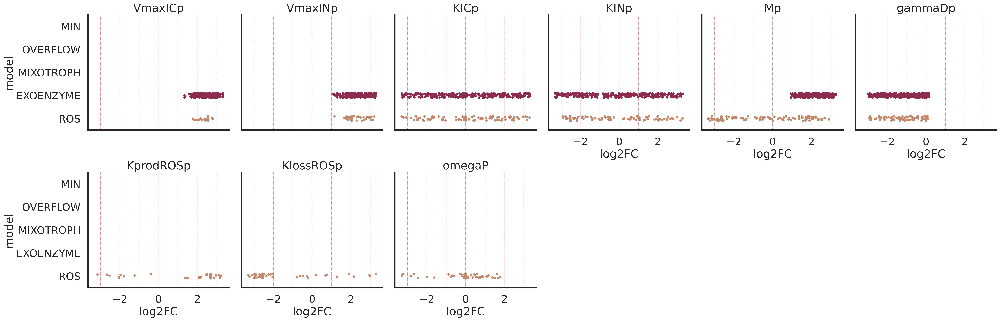

In [144]:
sns.set_context('poster')
g = sns.catplot(
    data=mparams_df.loc[mparams_df['fit'].isin(['good']) & ~mparams_df['FC'].isna()].reset_index(), 
    col='variable', x='FC', y='model', col_wrap=6, order=morder,
    hue='model', hue_order=morder, palette=mpalette, 
    legend=False,
).set_titles(col_template='{col_name}', row_template='{row_name}').set(xlabel='log2FC')

for (#row_val,
     col_val), ax in g.axes_dict.items():
    #refmean = refmaxday_df.loc[refmaxday_df['media'].isin([col_val]), col].mean()
    for i in [-3,-2,-1,0,1,2,3]:
        ax.axvline(i, color='red', ls='--', alpha=0.5, lw=0.5)


In [147]:
mparams_df.loc[mparams_df.variable.isin(['Koverflowp'])]

,model,idx,RMSE_lowN,RMSE_pro99,RMSE,lrank,fit,variable,value,default,FC


In [145]:
mparams_df.fit.value_counts()

bad     36539
good     6068
Name: fit, dtype: int64

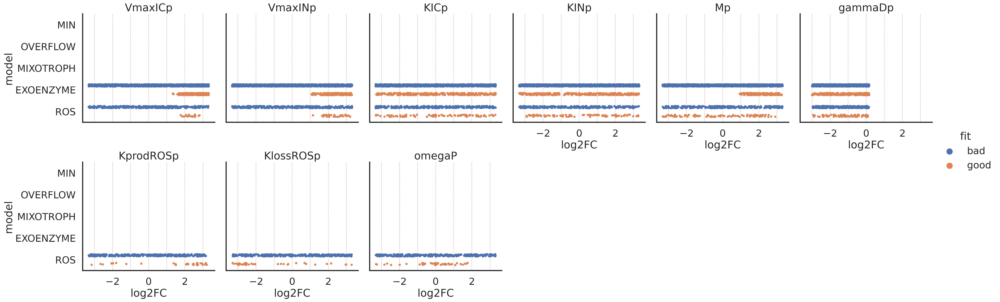

In [151]:
sns.set_context('poster')
g = sns.catplot(
    data=mparams_df.loc[~mparams_df['FC'].isna()].reset_index(), 
    col='variable', x='FC', y='model', col_wrap=6, order=morder,
    hue='fit', hue_order=['bad','good', ], #morder, palette=mpalette, 
    dodge=True,
    #legend=False,
).set_titles(col_template='{col_name}', row_template='{row_name}').set(xlabel='log2FC')

for (#row_val,
     col_val), ax in g.axes_dict.items():
    #refmean = refmaxday_df.loc[refmaxday_df['media'].isin([col_val]), col].mean()
    for i in [-3,-2,-1,0,1,2,3]:
        ax.axvline(i, color='red', ls='--', alpha=0.5, lw=0.5)


In [152]:
variables_to_show_log = ['gammaDp', 'KINp', 'KICp',
      'Mp_day',  'VmaxINp_day_cell', 'VmaxICp_day_cell',
       'gamma_DON2DINp_day_cell', 'KONp', 'KOCp', 'VmaxONp', 'VmaxOCp',
       'VmaxOCp_day_cell', 'VmaxONp_day_cell', 'omegaP',
       'E_ROSp_day']

variables_to_show_nolog = ['Vmax/K ICp', 'Vmax/K INp', 'R* INp',
       'R* ICp', 'Vmax/Vmax Ip',]


In [153]:
    min_params_to_update, _, _ = get_param_tuning_values('MIN', organism_to_tune)


In [154]:
from scipy.stats import pearsonr

def corrfunc(x, y, ax=None, **kws):
    """Plot the correlation coefficient in the top left hand corner of a plot."""
    r, _ = pearsonr(x, y)
    ax = ax or plt.gca()
    ax.annotate(f'ρ = {r:.2f}', xy=(.1, .9), xycoords=ax.transAxes)

In [156]:
def _get_corrs(model):
    mrows = min_rows 
    cur_params_to_update, _, _ = get_param_tuning_values(model, organism_to_tune)

    tmp = mparams_df.loc[
                    mparams_df.idx.isin(mrows.idx) &
                    mparams_df.model.isin([model]) 
                ]

    mtmp = tmp.pivot_table(index='idx', columns='variable', values='FC')[cur_params_to_update]
    corr_df = mtmp.corr()
    trimask = np.triu(np.ones_like(corr_df, dtype=bool))    
    corr_unstack = corr_df.mask(trimask).unstack().dropna()
    res_df = corr_unstack.rename_axis(['var1', 'var2']).reset_index().rename(columns={0:'correlation'})
    res_df['model'] = model
    return res_df
corr_df = pd.concat([_get_corrs(m) for m in mparams_df.model.unique() ], ignore_index=True)
corr_df

,var1,var2,correlation,model
0,VmaxICp,VmaxINp,0.010714,ROS
1,VmaxICp,KICp,0.117966,ROS
2,VmaxICp,KINp,-0.054936,ROS
3,VmaxICp,Mp,0.142346,ROS
4,VmaxICp,gammaDp,-0.064045,ROS
5,VmaxICp,KprodROSp,-0.036323,ROS
6,VmaxICp,KlossROSp,0.063378,ROS
7,VmaxICp,omegaP,0.031595,ROS
8,VmaxINp,KICp,-0.018612,ROS
9,VmaxINp,KINp,0.025095,ROS


In [157]:
corr_df['pair'] = corr_df.var1 +' / ' +  corr_df.var2

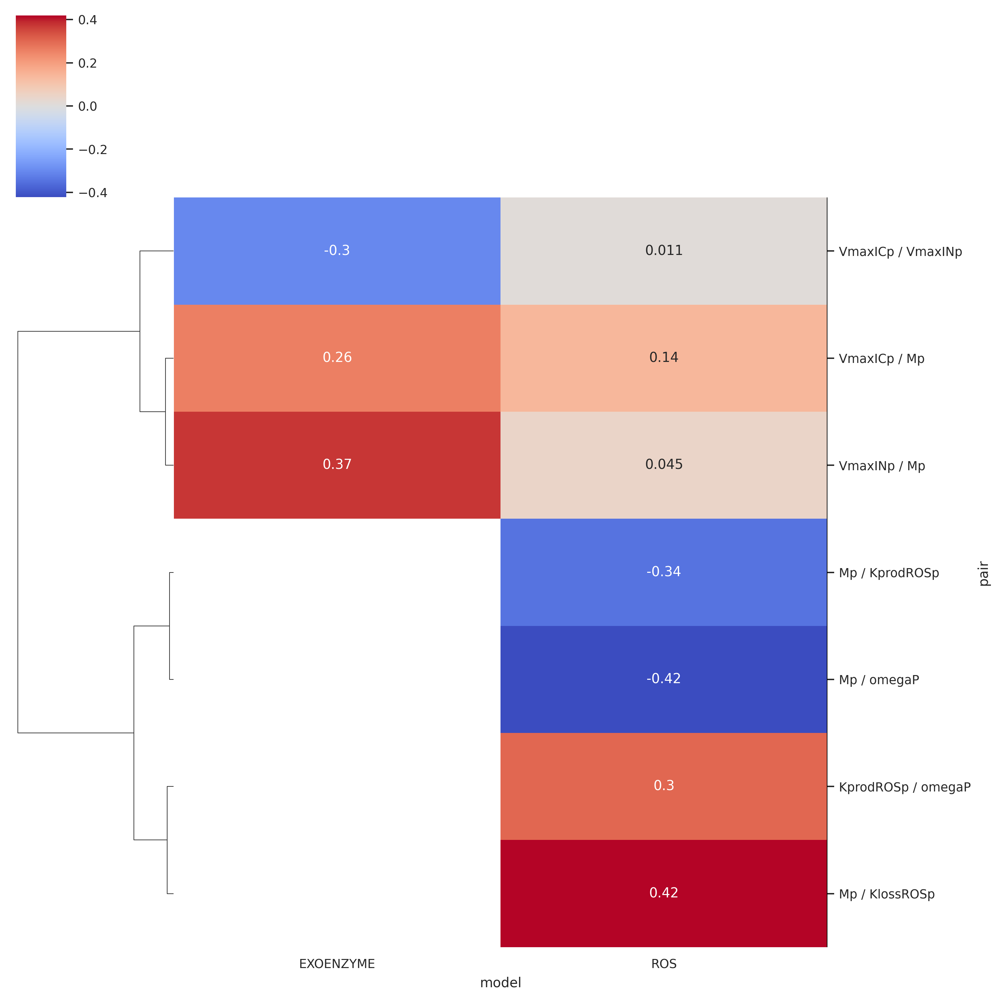

In [159]:
sns.set_context('paper')
corr_df_filtered = corr_df.loc[(corr_df.correlation > 0.2) | (corr_df.correlation < -0.2)]

pcorr_df = corr_df.loc[corr_df.pair.isin(corr_df_filtered.pair)].pivot_table(index='pair', columns=['model',  ], 
                               values='correlation', fill_value=3, dropna=True)
#pcorr_df = pcorr_df.reindex(columns=pcorr_df.columns.reindex(morder, level=0)[0])

g = sns.clustermap(
    pcorr_df, 
    cmap='coolwarm', 
    mask=pcorr_df==3,
    col_cluster=False,
    annot=True,
    figsize=(10,10),
)
ax = g.ax_heatmap  
for i in [2,4,6,8]:
    ax.axvline(i, c='black')


In [160]:
final_idxes = set(min_rows.idx)

In [161]:
selected_params = sum_df.loc[sum_df.idx.isin(final_idxes)]

In [162]:
from scipy.cluster.vq import whiten
from scipy.cluster.hierarchy import fcluster, linkage

#def _get_clusters(model):
#model='MIN'
#cur_params_to_update, _, _ = get_param_tuning_values(model, organism_to_tune)

cur_params_to_update = ['VmaxICp', 'VmaxINp', 'Mp',]

tmp = mparams_df.loc[
                mparams_df.idx.isin(final_idxes) #&
                #mparams_df.model.isin([model]) 
            ]

mtmp = tmp.pivot_table(index=['model','idx'], columns='variable', values='FC')[cur_params_to_update]


# standardize (normalize) the features
data = whiten(mtmp)

# Compute the distance matrix
matrix = linkage(
    data,
    method='ward',
    #method='average',
    #method='single',
    #method='centroid',
    #method='complete',
    metric='euclidean'
    )

# Assign cluster labels
labels = fcluster(
    matrix, 10, 
    criterion='distance'
    )

# Create DataFrame
#mtmp['labels'] = labels
    
#mtmp = _get_clusters('MIN')
# corr_df = pd.concat([_get_corrs(m,l) for m in morder for l in ('RMSE', 'lRMSE')], ignore_index=True)
# corr_df

In [163]:
labels_series = pd.Series(labels, index= mtmp.index.get_level_values(1))

In [164]:
mparams_df['cluster'] = mparams_df.idx.map(labels_series)

In [165]:
mparams_df['cluster'].value_counts()

3.0    1414
6.0    1361
4.0    1191
2.0    1010
1.0     682
5.0     410
Name: cluster, dtype: int64

In [166]:
mtmp

variable                                                       VmaxICp  \
model     idx                                                            
EXOENZYME monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1_...  3.313791   
          monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1_...  3.313791   
          monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1_...  3.313791   
          monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1_...  3.313791   
          monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1_...  2.903591   
...                                                                ...   
ROS       monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__79_ROS  2.561640   
          monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__80_ROS  2.561640   
          monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__88_ROS  2.561640   
          monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__94_ROS  2.561640   
          monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__99_ROS  2.561640   

variable                                                       VmaxINp  \
model     idx                                                            
EXOENZYME monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1_...  2.504214   
          monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1_...  2.919406   
          monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1_...  2.504214   
          monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1_...  2.011799   
          monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1_...  2.504214   
...                                                                ...   
ROS       monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__79_ROS  2.043246   
          monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__80_ROS  2.043246   
          monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__88_ROS  1.858377   
          monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__94_ROS  2.337765   
          monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__99_ROS  2.043246   

variable                                                            Mp  
model     idx                                                           
EXOENZYME monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1_...  2.662584  
          monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1_...  2.662584  
          monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1_...  2.662584  
          monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1_...  2.662584  
          monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1_...  2.662584  
...                                                                ...  
ROS       monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__79_ROS -0.164277  
          monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__80_ROS -2.640350  
          monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__88_ROS -1.374433  
          monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__94_ROS -0.234376  
          monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__99_ROS  1.810589  

[511 rows x 3 columns]

kmeans.labels_

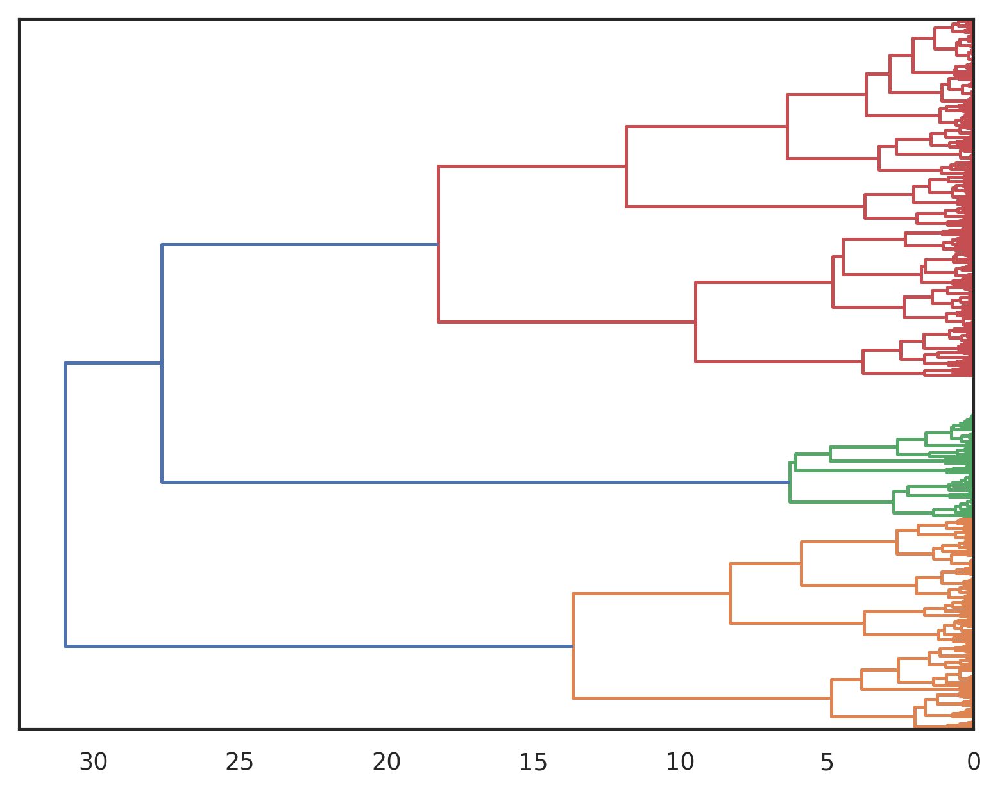

In [167]:
from scipy.cluster.hierarchy import dendrogram

dendrogram(matrix, no_labels=True, orientation='left')
plt.show()

In [168]:
lut = dict(zip(np.unique(labels), sns.color_palette('Set2', n_colors=np.max(labels)+1).as_hex()))
row_colors = np.vectorize(lut.get)(labels) 


In [169]:
mtmp

variable                                                       VmaxICp  \
model     idx                                                            
EXOENZYME monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1_...  3.313791   
          monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1_...  3.313791   
          monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1_...  3.313791   
          monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1_...  3.313791   
          monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1_...  2.903591   
...                                                                ...   
ROS       monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__79_ROS  2.561640   
          monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__80_ROS  2.561640   
          monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__88_ROS  2.561640   
          monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__94_ROS  2.561640   
          monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__99_ROS  2.561640   

variable                                                       VmaxINp  \
model     idx                                                            
EXOENZYME monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1_...  2.504214   
          monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1_...  2.919406   
          monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1_...  2.504214   
          monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1_...  2.011799   
          monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1_...  2.504214   
...                                                                ...   
ROS       monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__79_ROS  2.043246   
          monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__80_ROS  2.043246   
          monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__88_ROS  1.858377   
          monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__94_ROS  2.337765   
          monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__99_ROS  2.043246   

variable                                                            Mp  
model     idx                                                           
EXOENZYME monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1_...  2.662584  
          monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1_...  2.662584  
          monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1_...  2.662584  
          monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1_...  2.662584  
          monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1_...  2.662584  
...                                                                ...  
ROS       monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__79_ROS -0.164277  
          monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__80_ROS -2.640350  
          monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__88_ROS -1.374433  
          monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__94_ROS -0.234376  
          monte2_ponly_ROS_vpro_19_33_ROS_C0_9_monte__99_ROS  1.810589  

[511 rows x 3 columns]

In [170]:
mtmp.min()

variable
VmaxICp    1.333079
VmaxINp    1.078159
Mp        -3.317933
dtype: float64

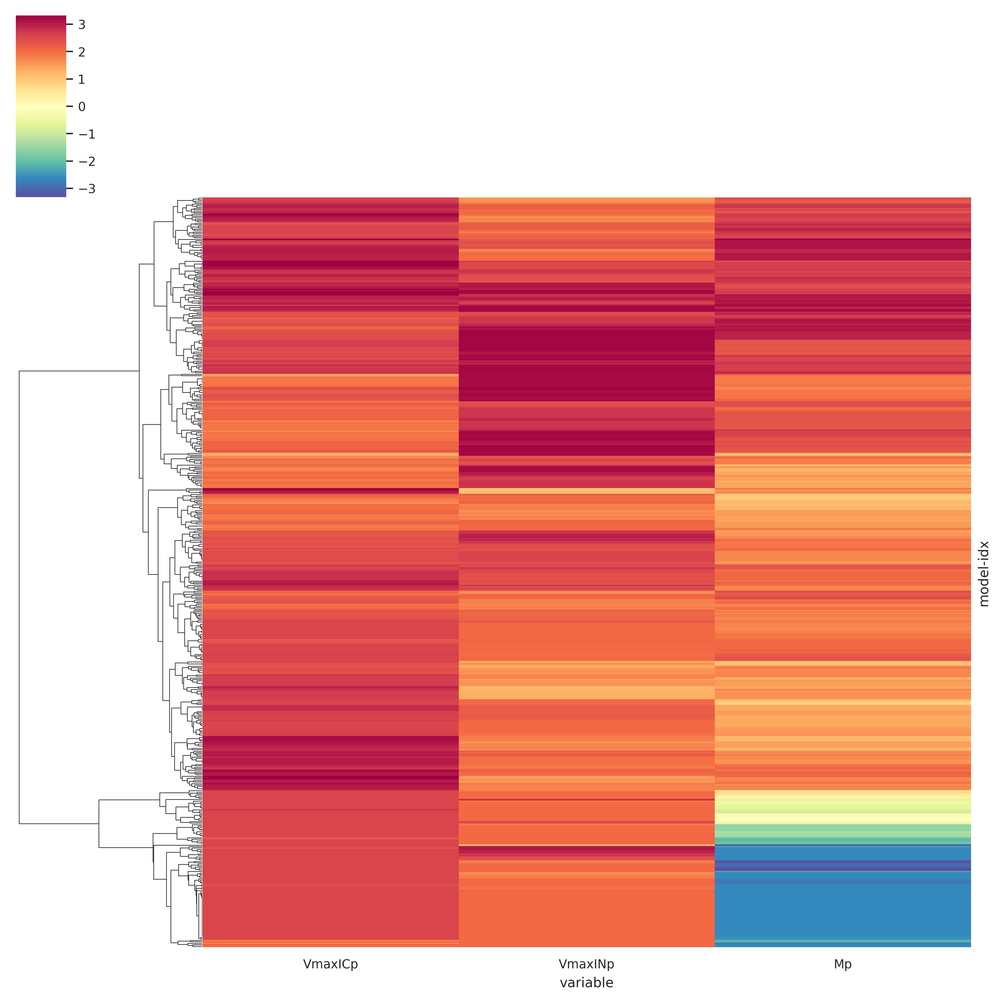

In [173]:
cg = sns.clustermap(
    data=mtmp, col_cluster=False, #row_linkage=matrix, 
    cmap='Spectral_r', #vmin=1,
    #row_colors=row_colors,
    yticklabels=False,
              )

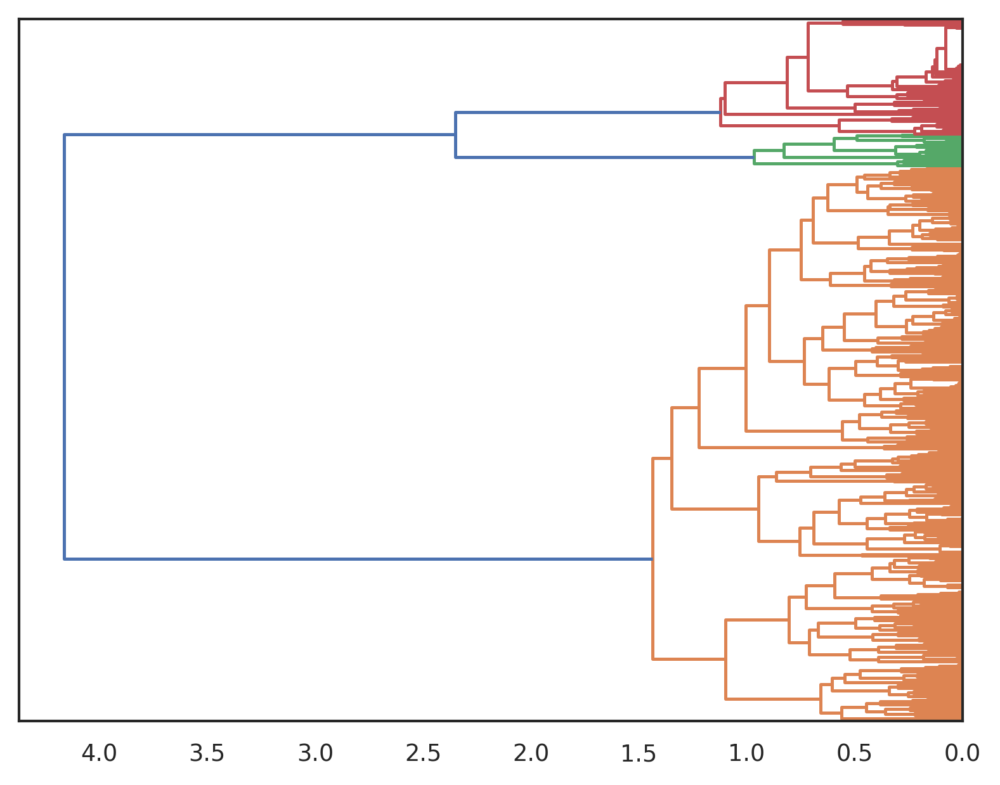

In [175]:
import scipy
matrix=cg.dendrogram_row.linkage
den = dendrogram(
    matrix, no_labels=True, orientation='left', 
    labels = mtmp.index.get_level_values(1),
    color_threshold=1.5           
          )
plt.show()
# scipy.cluster.hierarchy.dendrogram(g.dendrogram_row.linkage,
#                                          labels = mtmp.index,
#                                   #       color_threshold=0.60
#                                   )  

In [176]:
cluster_ids = pd.DataFrame(data={'labels': den['leaves_color_list']}, index=den['ivl'], )

In [182]:
mtmp1 = mtmp.copy()
mtmp1['labels'] = mtmp1.index.get_level_values(1).map(cluster_ids['labels']) 
mtmp1.reset_index(inplace=True)

In [183]:
labels=mtmp.index.get_level_values(1).map(cluster_ids['labels']) 
labels.index= mtmp.index.get_level_values(1)

In [184]:
cluster_ids.labels.value_counts()

C1    404
C3     84
C2     23
Name: labels, dtype: int64

In [185]:
mtmp1.labels.value_counts()

C1    404
C3     84
C2     23
Name: labels, dtype: int64

In [186]:
mparams_df['cluster'] = mparams_df.idx.map(cluster_ids['labels']) 

In [188]:
corder=['C1', 'C2', 'C3', ]

In [189]:
lut = dict(zip(corder+['C0'], sns.color_palette('Set2', n_colors=cluster_ids.labels.nunique()).as_hex()))
row_colors = np.vectorize(lut.get)(labels) 


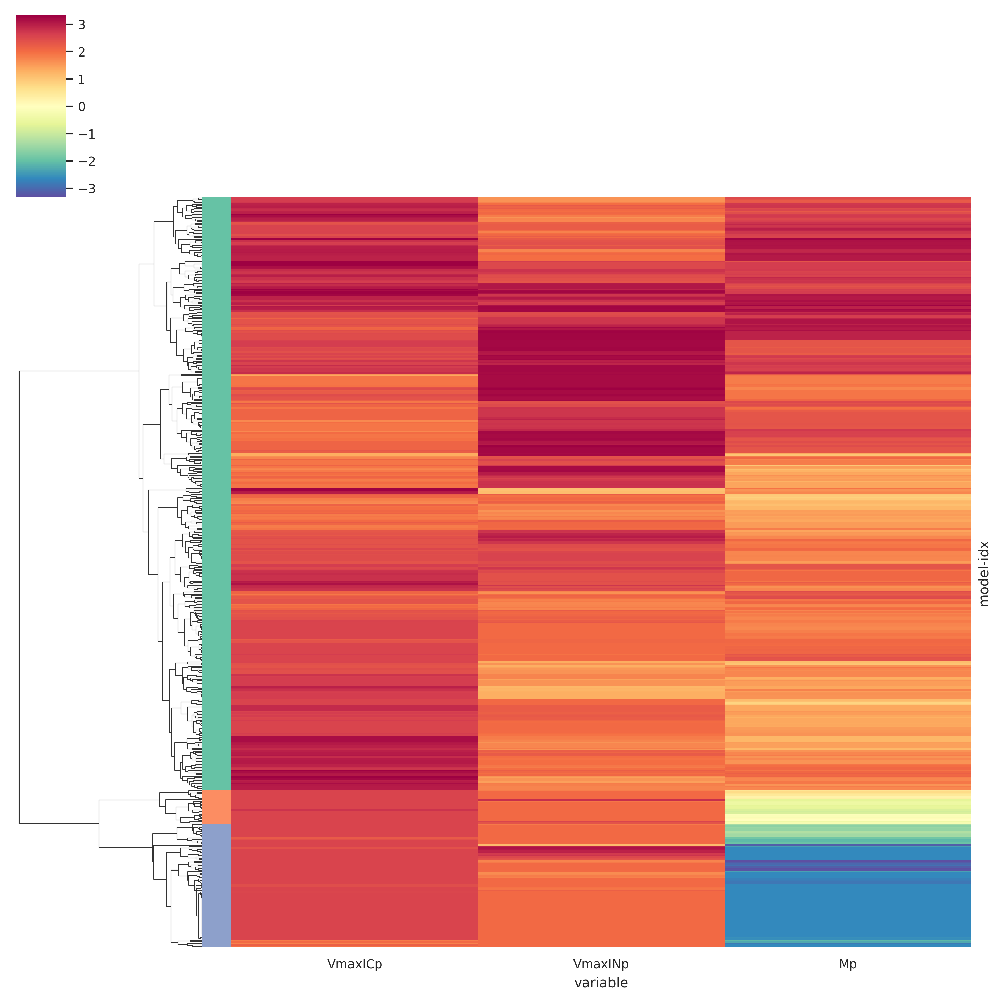

In [191]:
cg = sns.clustermap(
    data=mtmp, col_cluster=False, row_linkage=matrix, 
    cmap='Spectral_r', #vmin=1,
    row_colors=row_colors,
    yticklabels=False,
              )

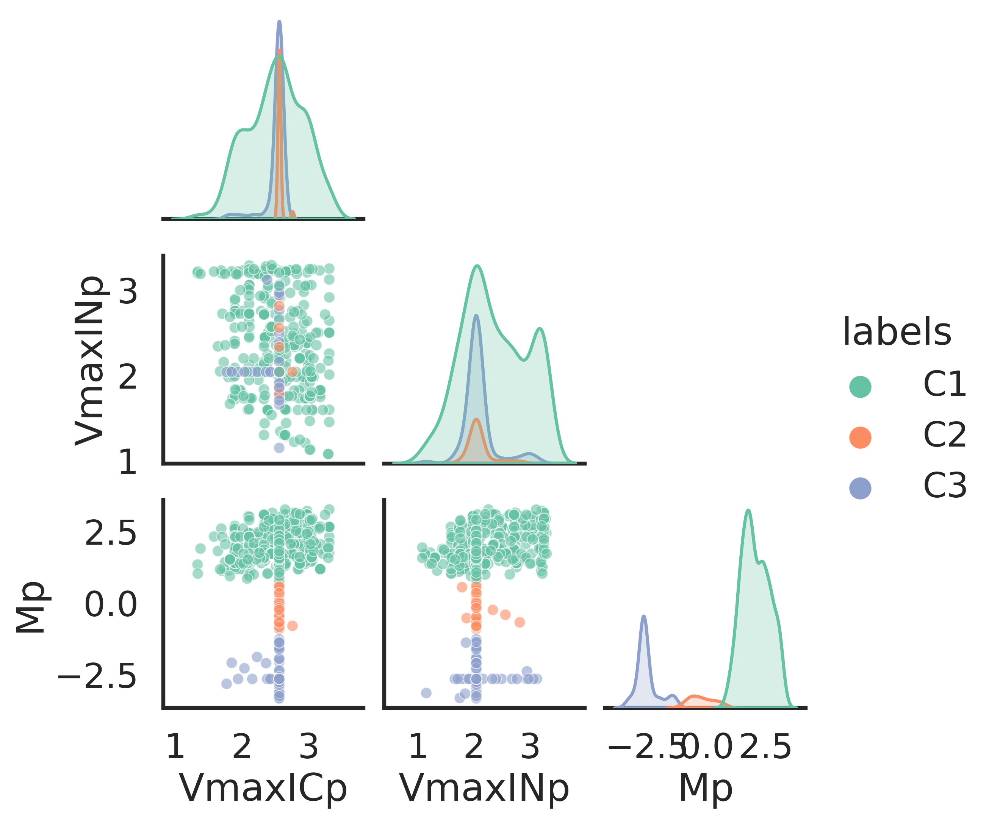

In [192]:
sns.set_context('poster')
g = sns.pairplot(
    data=mtmp1, hue='labels', palette='Set2', hue_order=corder, corner=True,
    #plot_kws=dict(marker="+", linewidth=2, alpha=0.5),
    plot_kws=dict(alpha=0.6, s=50),
)
#g.map_lower(sns.kdeplot, levels=1)


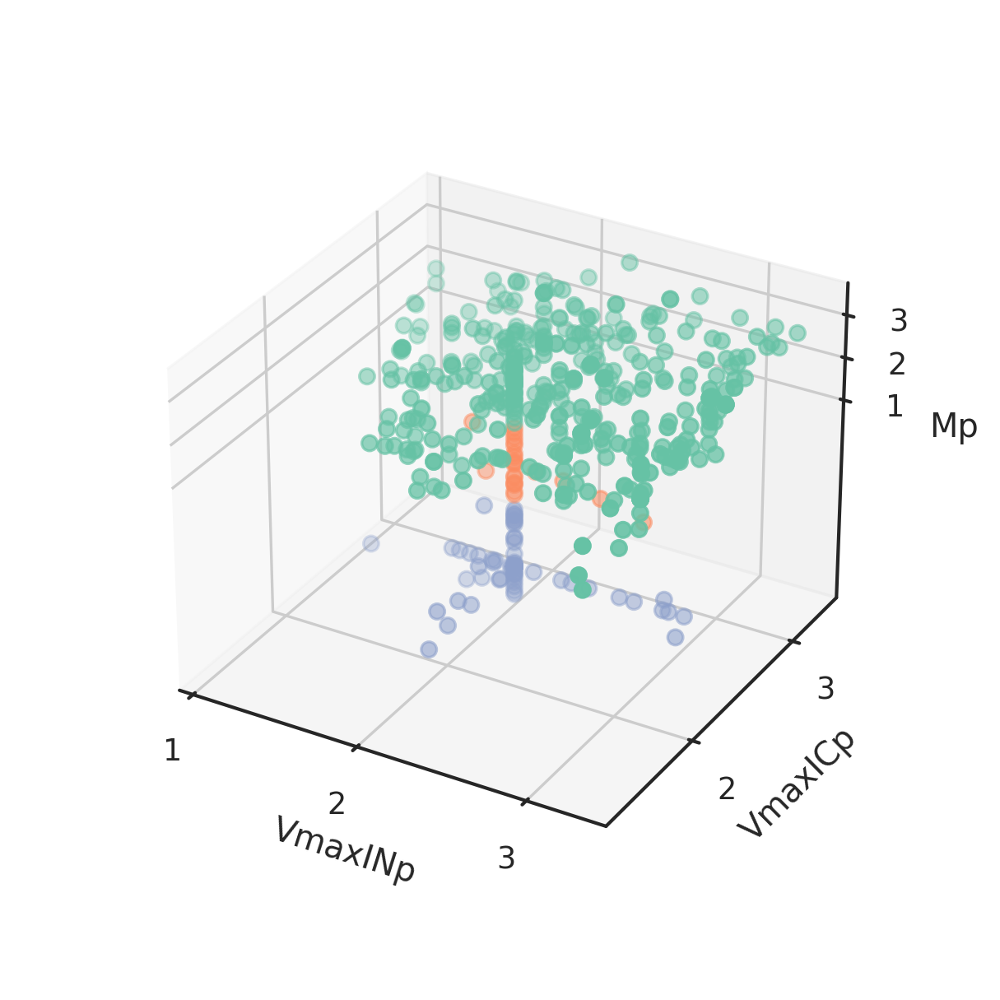

In [193]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
sns.set_context('paper')
# g = sns.pairplot(
#     data=mtmp1, hue='labels', palette='Set2', hue_order=corder,


fig = plt.figure(figsize=(5,5))
ax = plt.axes(projection = '3d')
#ax = fig.add_subplot(111, projection = '3d', )

ax.set_ylabel("VmaxICp")
ax.set_xlabel("VmaxINp")
ax.set_zlabel("Mp")
ax.set_xticks([1,2,3])
ax.set_yticks([1,2,3])
ax.set_zticks([1,2,3])
ax.scatter3D(
    data=mtmp1,
    ys = 'VmaxICp',
    xs = 'VmaxINp',
    zs = 'Mp',
    c = np.vectorize(lut.get)(mtmp1.labels) 
    
)
ax.set_box_aspect(aspect=None, zoom=0.8)
plt.show()

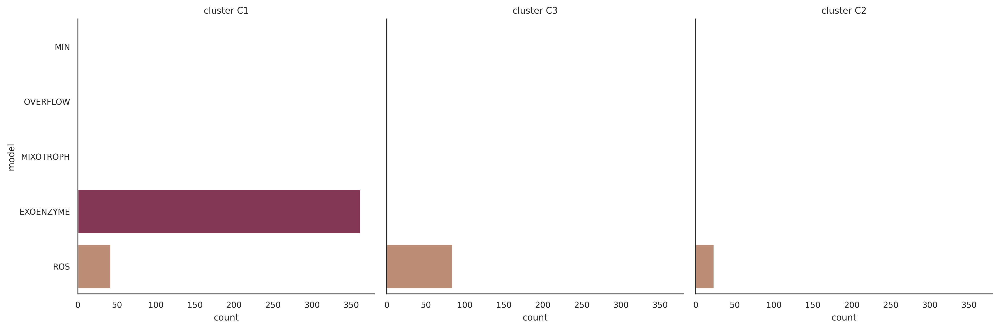

In [194]:
sns.catplot(
    data=mtmp1,
    col='labels', 
    y='model', hue='model', hue_order=morder, order=morder, palette=mpalette,dodge=False,
    kind='count',
    legend=False,
).set_titles(col_template='cluster {col_name}', row_template='{row_name}')

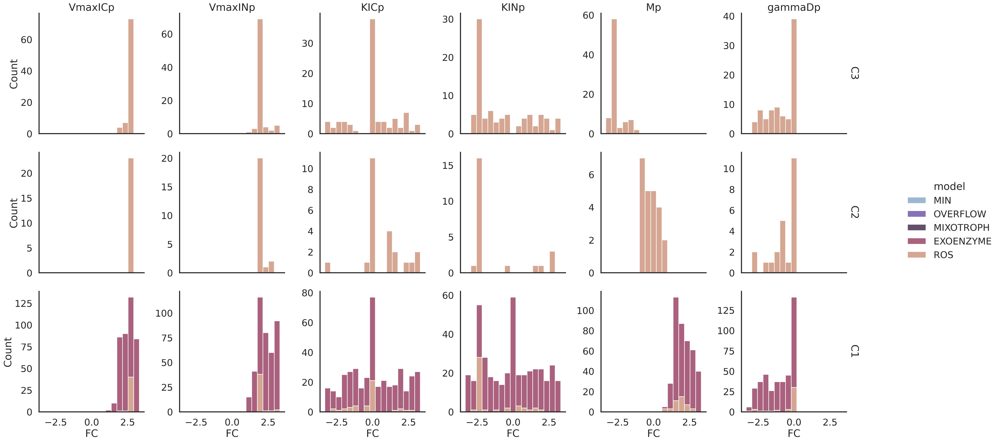

In [195]:
sns.set_context('poster')
sns.displot(
    data=mparams_df.loc[~mparams_df['cluster'].isna() & mparams_df.variable.isin(min_params_to_update)], 
    col='variable', row='cluster', x='FC',  #col_wrap=3,
    hue='model', hue_order=morder, palette=mpalette, multiple='stack',
    facet_kws=dict(sharey=False, margin_titles=True),
    
).set_titles(col_template='{col_name}', row_template='{row_name}')

In [196]:
mtmp.columns

Index(['VmaxICp', 'VmaxINp', 'Mp'], dtype='object', name='variable')

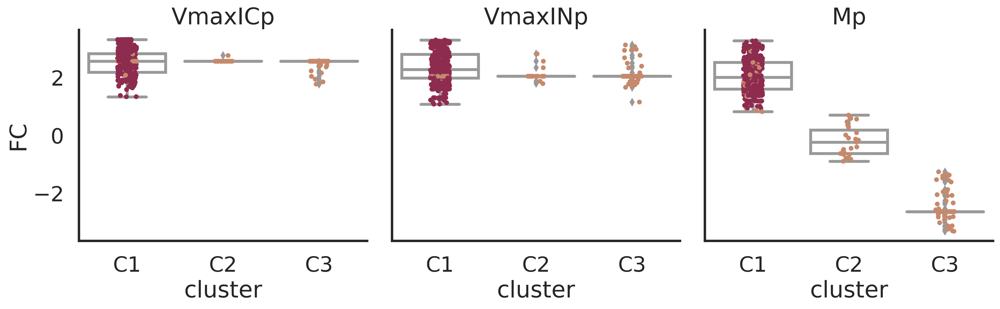

In [197]:
sns.set_context('poster')
g = sns.catplot(
    data=mparams_df.loc[mparams_df['cluster'].isin(corder) & mparams_df.variable.isin(mtmp.columns)], 
    col='variable', y='FC', x='cluster', #fill=None,#hue='cluster', #col_wrap=3,
    #hue='model', hue_order=morder, palette=mpalette, #multiple='stack',
    kind='box', dodge=False, col_wrap=3,color='white', order=corder,
    facet_kws=dict(sharey=False, margin_titles=True),
    
).set_titles(col_template='{col_name}', row_template='{row_name}')
g.map_dataframe(sns.stripplot, y='FC', x='cluster', order=corder,
    hue='model', hue_order=morder, palette=mpalette, #multiple='stack',
     )


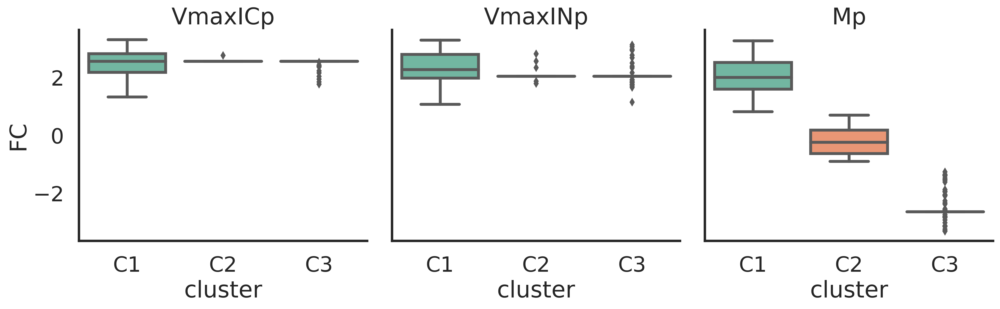

In [198]:
sns.set_context('poster')
g = sns.catplot(
    data=mparams_df.loc[mparams_df['cluster'].isin(corder) & mparams_df.variable.isin(mtmp.columns)], 
    col='variable', y='FC', x='cluster', hue='cluster', 
    hue_order=corder, palette='Set2', 
    kind='box', order=corder, dodge=False,
    facet_kws=dict(sharey=False, margin_titles=True),
    
).set_titles(col_template='{col_name}', row_template='{row_name}')


In [199]:
corder1 = ['C0', 'C1', 'C2', 'C3', 'C4']

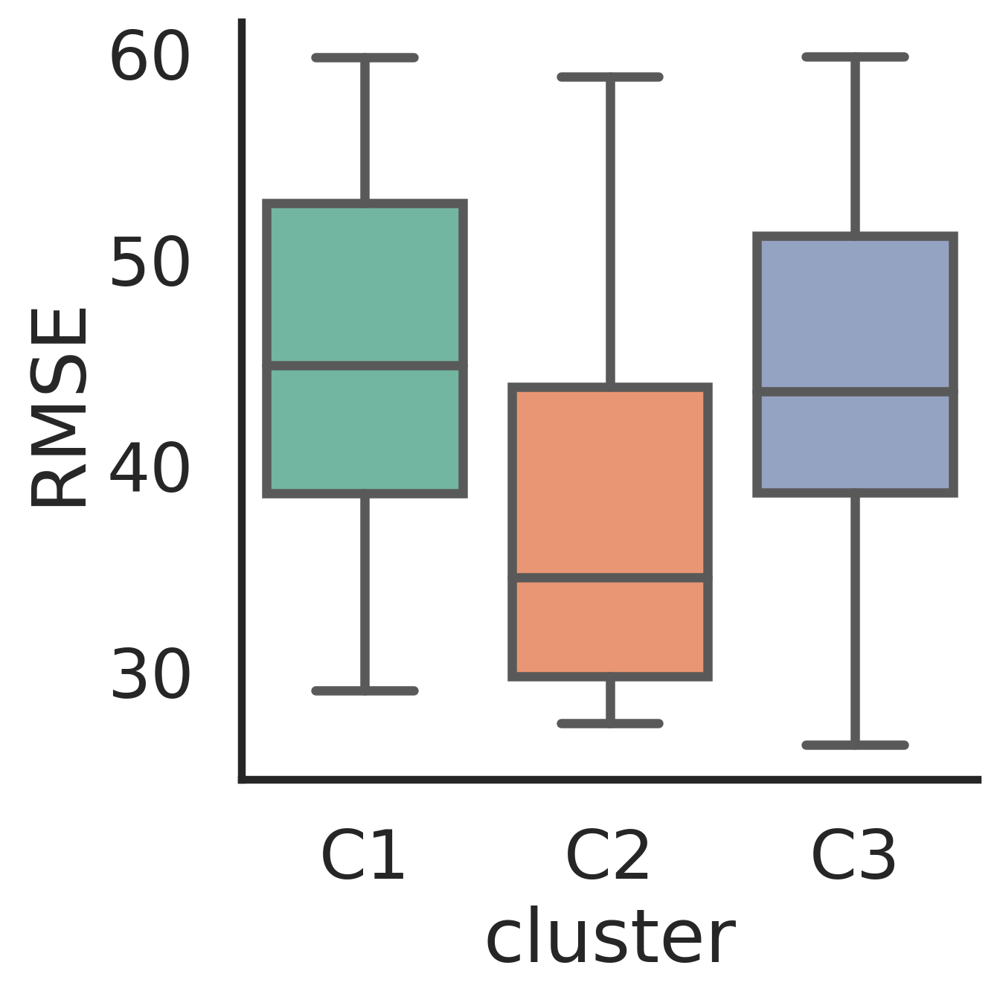

In [200]:
sns.set_context('poster')
g = sns.catplot(
    data=mparams_df.loc[mparams_df['cluster'].isin(corder1) ], 
     y='RMSE', x='cluster', hue='cluster', 
    hue_order=corder, palette='Set2', 
    kind='box', order=corder, dodge=False,
    facet_kws=dict(sharey=False, margin_titles=True),
    
).set_titles(col_template='{col_name}', row_template='{row_name}')


In [201]:
mparams_df.variable.unique()

array(['VmaxICp', 'VmaxINp', 'KICp', 'KINp', 'Mp', 'gammaDp', 'KprodROSp',
       'KlossROSp', 'omegaP', 'Vmax/K ICp', 'Vmax/K INp', 'R* INp',
       'R* ICp', 'Vmax/Vmax Ip'], dtype=object)

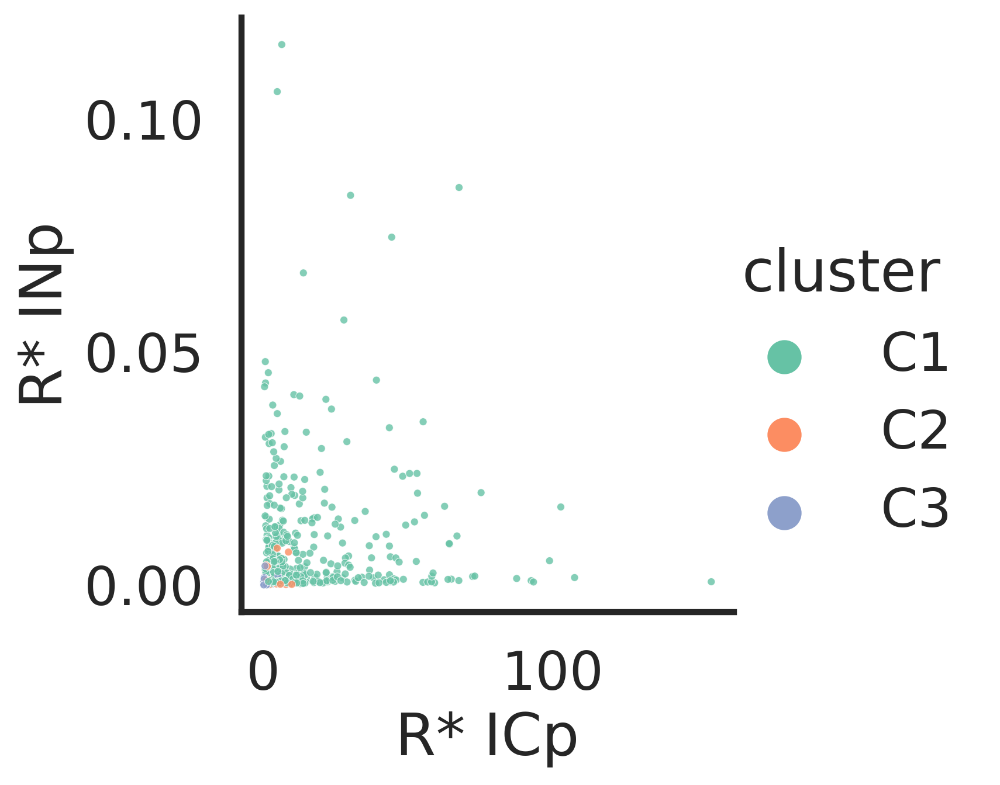

In [202]:
sns.set_context('poster')
g = sns.relplot(
    data=mparams_df.loc[
        mparams_df['cluster'].isin(corder) & mparams_df.variable.isin(['R* INp', 'R* ICp'])
    ].pivot_table(index=['model','idx', 'cluster'], columns='variable', values='value').reset_index(),
    
    y='R* INp', x='R* ICp', s=10, alpha=0.8,
    hue='cluster',hue_order=corder, palette='Set2',
    
)


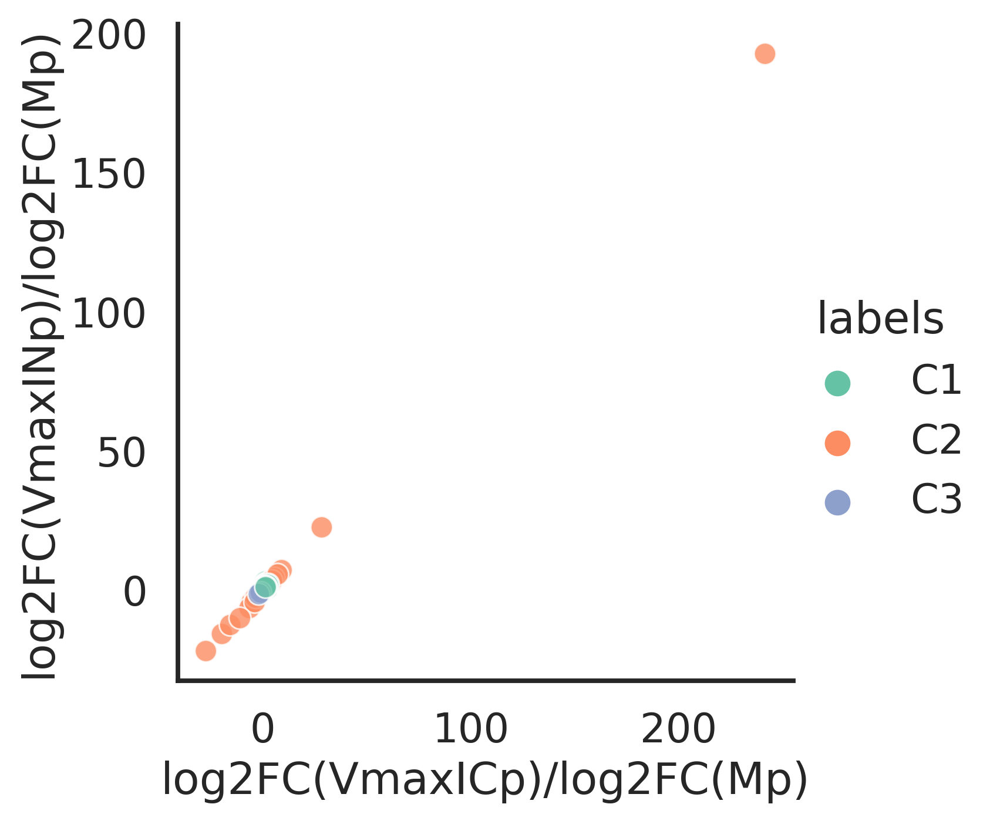

In [203]:
mtmp1['log2FC(VmaxINp)/log2FC(Mp)'] = mtmp1.VmaxINp / mtmp1.Mp
mtmp1['log2FC(VmaxICp)/log2FC(Mp)'] = mtmp1.VmaxICp / mtmp1.Mp
sns.set_context('talk')
g = sns.relplot(
    data=mtmp1,
    y='log2FC(VmaxINp)/log2FC(Mp)', x='log2FC(VmaxICp)/log2FC(Mp)', #s=10, 
    alpha=0.8,
    hue='labels',hue_order=corder, palette='Set2',
    #hue='model',hue_order=morder, palette=mpalette,
    
)


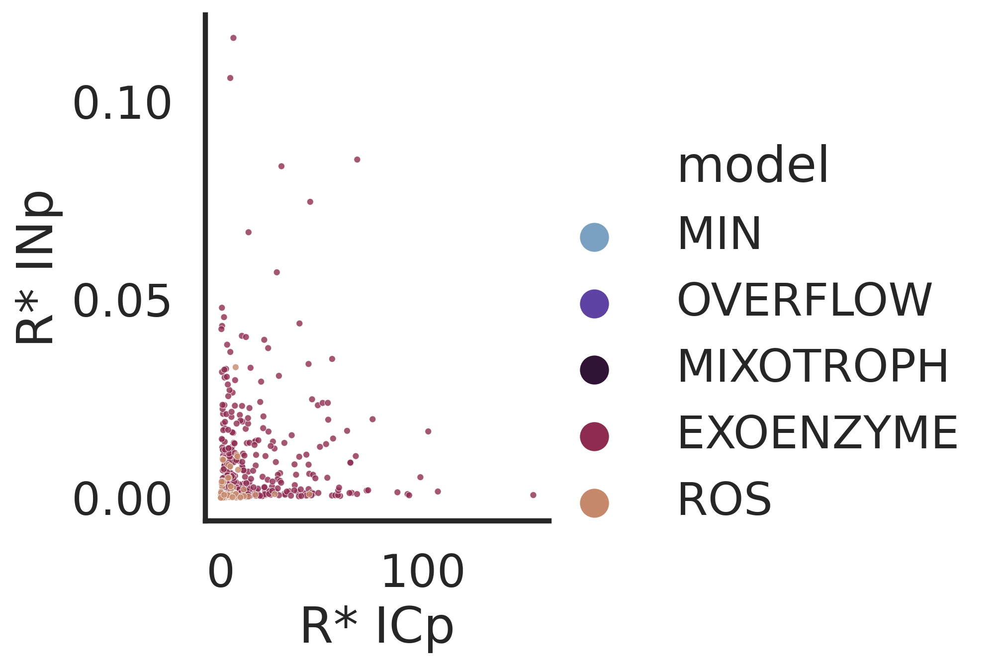

In [204]:
sns.set_context('poster')
g = sns.relplot(
    data=mparams_df.loc[
        mparams_df['cluster'].isin(corder) & mparams_df.variable.isin(['R* INp', 'R* ICp'])
    ].pivot_table(index=['model','idx', 'cluster'], columns='variable', values='value').reset_index(),
    
    y='R* INp', x='R* ICp', s=10, alpha=0.8,
    hue='model',hue_order=morder, palette=mpalette,
    
)


In [205]:
bestdf = df.loc[df.idx.isin(mtmp1.idx)]

In [206]:
bestdf = pd.merge(bestdf, mtmp1, on=['model', 'idx'])
bestdf.head()

,Bp,Np,Cp,DON,RDON,DIN,DOC,RDOC,DIC,ROS,...,media,which,model,hash,VmaxICp,VmaxINp,Mp,labels,log2FC(VmaxINp)/log2FC(Mp),log2FC(VmaxICp)/log2FC(Mp)
0,0.892857,0.000000,0.000000,3.000000,0.000000,800.000000,19.875000,0.000000,2241.552301,0.2,...,pro99,ponly,EXOENZYME,h7074824497105437591,3.313791,3.128684,2.662584,C1,1.175056,1.244577
1,1.595932,0.950400,5.680373,3.739517,0.186350,797.420658,24.647358,1.193090,2225.901964,0.2,...,pro99,ponly,EXOENZYME,h7074824497105437591,3.313791,3.128684,2.662584,C1,1.175056,1.244577
2,4.533106,2.714428,16.215822,6.109548,0.781325,789.754449,39.835824,4.990206,2180.711170,0.2,...,pro99,ponly,EXOENZYME,h7074824497105437591,3.313791,3.128684,2.662584,C1,1.175056,1.244577
3,14.847340,8.896318,53.009042,14.456054,2.873581,762.819563,93.215794,18.335198,2024.364014,0.2,...,pro99,ponly,EXOENZYME,h7074824497105437591,3.313791,3.128684,2.662584,C1,1.175056,1.244577
4,43.585451,26.173774,154.498751,37.899843,8.747614,687.486175,242.776981,55.725495,1590.780117,0.2,...,pro99,ponly,EXOENZYME,h7074824497105437591,3.313791,3.128684,2.662584,C1,1.175056,1.244577


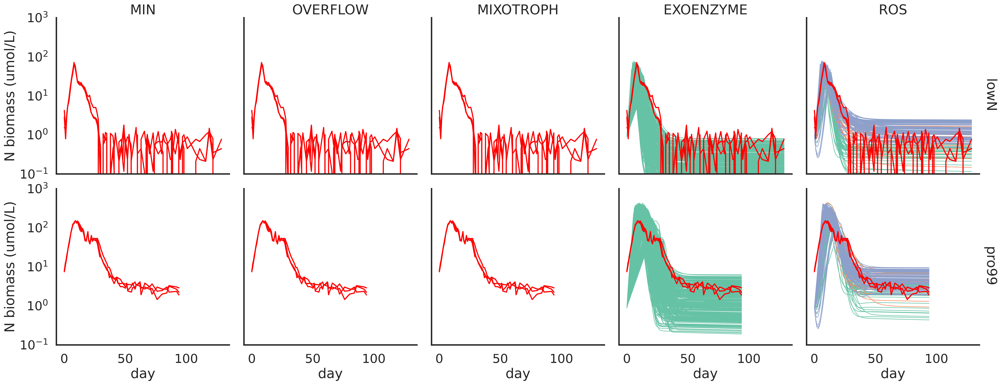

In [207]:
for n in ('N',):
    l= 'RMSE'
    g = sns.relplot(
        data=bestdf,
        kind='line', 
        estimator=None, units='idx',
        x='day', y=f'Bptotal[{n}]', 
        row='media', row_order=media_order, lw=1,
        hue='labels', hue_order=corder, palette='Set2',
        col='model', col_order=morder, 
        facet_kws=dict( margin_titles=True),
        legend=False
    )
    for (row_val,col_val), ax in g.axes_dict.items():
        datadf = refdf if row_val == 'lowN' else refp99df
        sns.lineplot(data=datadf, x='day', y=f'ref_Bp[{n}]',
        units='Sample', estimator=None, ax=ax, lw=2, color='red',

                     legend=False
                    )
    g.set(yscale='log', ylim=(1e-1,1e3))
    g.set(ylabel=f'{n} biomass (umol/L)')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')
    #plt.suptitle(f'{n} - top models ({l})', y=1.03)

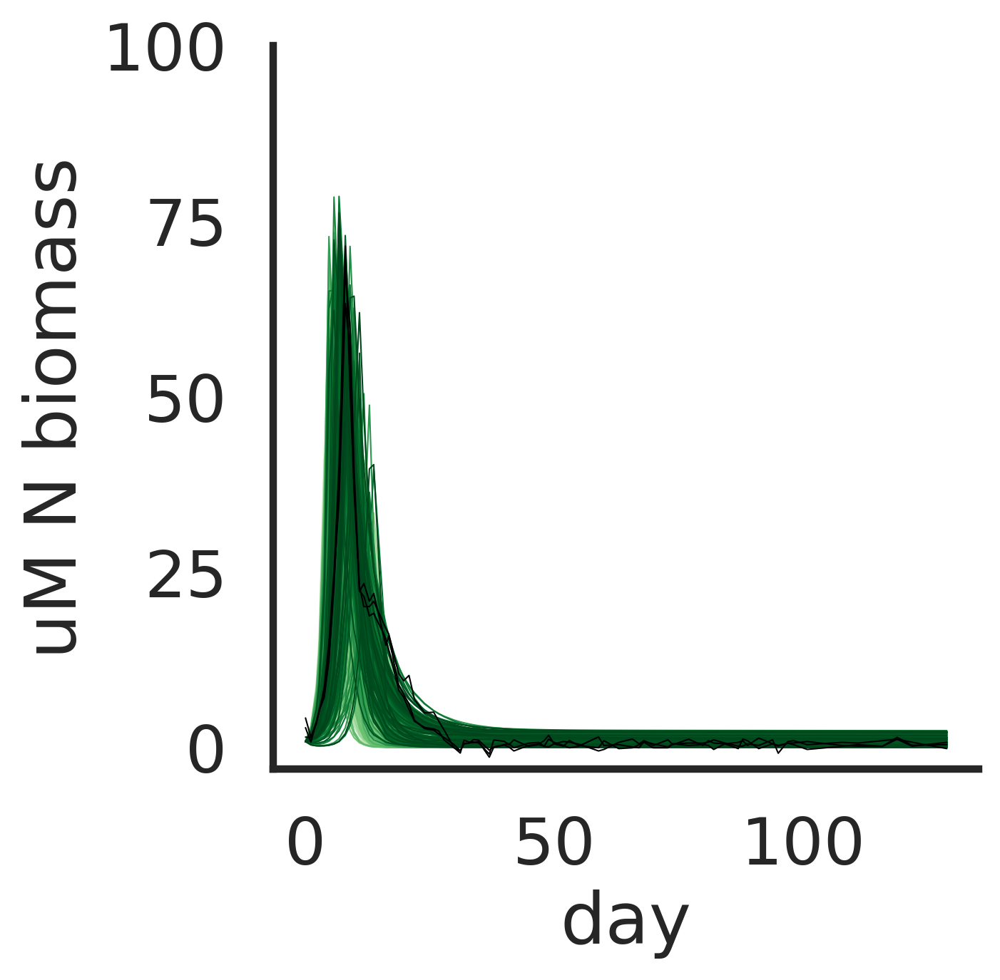

In [208]:

import matplotlib.colors as colors

curdf = bestdf
curdf = bestdf.loc[#bestdf.model.isin(['MIN']) & 
                   bestdf.media.isin(['lowN']) ]


g = sns.relplot(
    data=curdf, x='day', y='Bptotal[N]',
    units='run_id', estimator=None,
     kind='line', #hue_norm=colors.LogNorm(),
     lw=0.5, legend=False, palette='Greens',
    hue='run_id',
    facet_kws=dict(sharey=False),
)
    
datadf = refdf 
sns.lineplot(data=datadf, x='day', y='ref_Bp[N]',
units='Sample', estimator=None,  lw=0.5, color='black',

             legend=False
            )
g.set_titles(col_template='{col_name}', row_template='{row_name}')
g.set(ylabel='uM N biomass')
plt.ylim((-3,100))
#plt.suptitle(f'doubled VmaxICp', y=1.05)
plt.show()


In [209]:
corder2 = ['C1', 'C2', 'C3', 'C4', 'C0',]

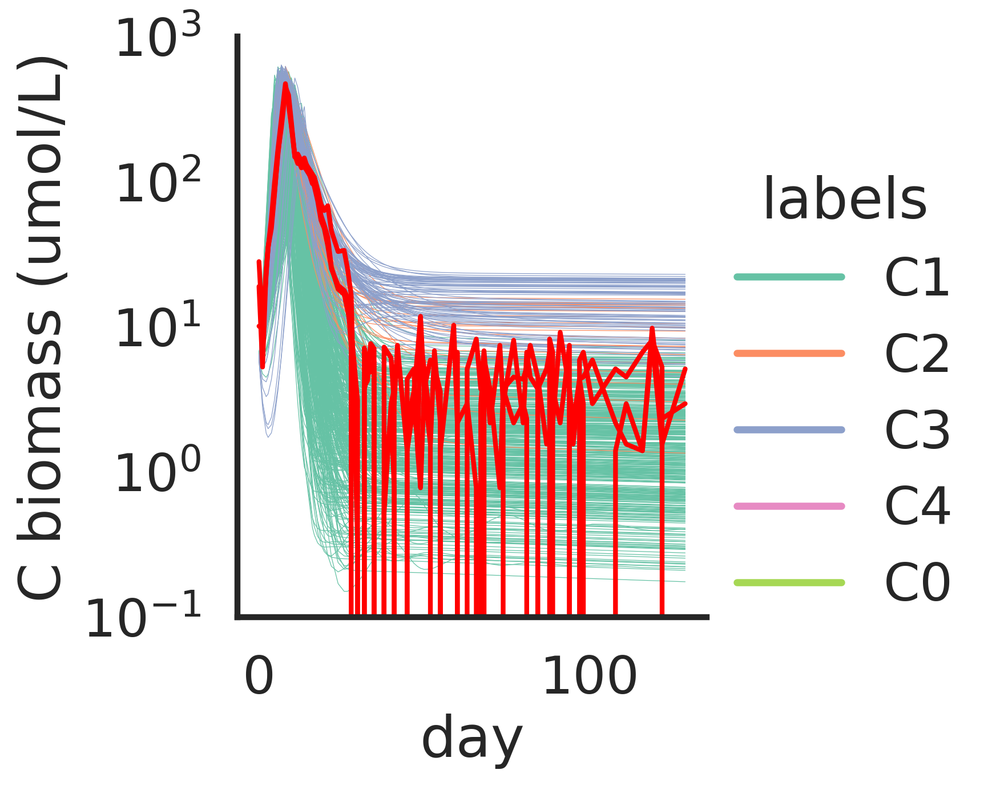

In [210]:
for n in ('C',):
    l= 'RMSE'
    g = sns.relplot(
        data=bestdf.loc[bestdf.media.isin(['lowN'])],
        kind='line', 
        estimator=None, units='idx',
        x='day', y=f'Bptotal[{n}]', 
        #row='media', row_order=media_order, 
        lw=0.3,
        hue='labels', hue_order=corder2, palette='Set2',
        #col='model', col_order=morder, 
        facet_kws=dict( margin_titles=True),
        #legend=False
    )
    #for row_val, ax in g.axes_dict.items():
    datadf = refdf #if row_val == 'lowN' else refp99df
    sns.lineplot(data=datadf, x='day', y=f'ref_Bp[{n}]',
    units='Sample', estimator=None, lw=2, color='red',

                 legend=False
                )
    g.set(yscale='log', ylim=(1e-1,1e3))
    g.set(ylabel=f'{n} biomass (umol/L)')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')
    #plt.suptitle(f'{n} - top models ({l})', y=1.03)

In [211]:
bestdf.columns

Index(['Bp', 'Np', 'Cp', 'DON', 'RDON', 'DIN', 'DOC', 'RDOC', 'DIC', 'ROS',
       't', 'day', 'gross_uptakeINp', 'gross_uptakeONp', 'gross_uptakeICp',
       'gross_uptakeOCp', 'uptakeNp', 'uptakeCp', 'QCp', 'biosynthesisNp',
       'respirationCp', 'biomass_breakdownCp', 'overflowNp', 'overflowCp',
       'Bp[C]', 'Bptotal[N]', 'Bptotal[C]', 'run_id', 'idx', 'id', 'media',
       'which', 'model', 'hash', 'VmaxICp', 'VmaxINp', 'Mp', 'labels',
       'log2FC(VmaxINp)/log2FC(Mp)', 'log2FC(VmaxICp)/log2FC(Mp)'],
      dtype='object')

In [212]:
bestdf['Np/Bp'] = bestdf['Np'] / bestdf['Bp']
bestdf['Cp/Bp'] = bestdf['Cp'] / bestdf['Bp[C]']


In [213]:
df

,Bp,Np,Cp,DON,RDON,DIN,DOC,RDOC,DIC,ROS,...,Bp[C],Bptotal[N],Bptotal[C],run_id,idx,id,media,which,model,hash
0,0.892857,0.000000,0.000000,3.000000,0.000000,100.000000,19.875000,0.000000,2241.552301,0.200000,...,5.915179,0.892857,5.915179,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,lowN,ponly,EXOENZYME,h7074824497105437591
1,0.460973,0.285970,0.050445,3.287178,0.335434,99.523302,21.260458,1.580745,2241.403018,0.200000,...,3.053943,0.746942,3.104388,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,lowN,ponly,EXOENZYME,h7074824497105437591
2,0.247014,0.160726,0.032411,3.459873,0.540828,99.484416,22.000856,2.425505,2241.278427,0.200000,...,1.636465,0.407740,1.668876,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,lowN,ponly,EXOENZYME,h7074824497105437591
3,0.176908,0.115323,0.023417,3.515566,0.609010,99.476051,22.245365,2.704479,2241.246254,0.200000,...,1.172014,0.292231,1.195432,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,lowN,ponly,EXOENZYME,h7074824497105437591
4,0.099386,0.064814,0.013184,3.574561,0.684474,99.469622,22.515908,3.013156,2241.224707,0.200000,...,0.658430,0.164200,0.671614,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,monte2_ponly_EXOENZYME_vpro_11_62_EXOENZYME_C1...,lowN,ponly,EXOENZYME,h7074824497105437591
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
475459,258.134139,0.281695,772.684562,429.160202,116.316814,0.000006,3903.284322,970.852330,2162.151788,0.002410,...,1710.138673,258.415835,2482.823234,monte2_ponly_ROS_vpro_19_33_ROS_C0_2_monte__38...,monte2_ponly_ROS_vpro_19_33_ROS_C0_2_monte__38...,monte2_ponly_ROS_vpro_19_33_ROS_C0_2_monte__38,pro99,ponly,ROS,h3292284166414200945
475460,245.166186,0.288116,733.871485,438.857813,119.580736,0.000006,4028.716445,1002.210361,2162.328790,0.002406,...,1624.225981,245.454302,2358.097466,monte2_ponly_ROS_vpro_19_33_ROS_C0_2_monte__38...,monte2_ponly_ROS_vpro_19_33_ROS_C0_2_monte__38...,monte2_ponly_ROS_vpro_19_33_ROS_C0_2_monte__38,pro99,ponly,ROS,h3292284166414200945
475461,239.230540,0.291040,716.106062,443.274769,121.096502,0.000007,4086.963577,1016.772144,2162.171383,0.002404,...,1584.902325,239.521580,2301.008386,monte2_ponly_ROS_vpro_19_33_ROS_C0_2_monte__38...,monte2_ponly_ROS_vpro_19_33_ROS_C0_2_monte__38...,monte2_ponly_ROS_vpro_19_33_ROS_C0_2_monte__38,pro99,ponly,ROS,h3292284166414200945
475462,221.107153,0.299905,661.862536,456.663486,125.822307,0.000007,4268.548694,1062.168424,2160.986182,0.002397,...,1464.834886,221.407057,2126.697422,monte2_ponly_ROS_vpro_19_33_ROS_C0_2_monte__38...,monte2_ponly_ROS_vpro_19_33_ROS_C0_2_monte__38...,monte2_ponly_ROS_vpro_19_33_ROS_C0_2_monte__38,pro99,ponly,ROS,h3292284166414200945


In [214]:
def _compute_ratio(x):
    Nstore_col = 'Np'
    Nbiomass_col = 'Bp'
    Cstore_col = 'Cp'
    Cbiomass_col = 'Bp[C]'
    qc_col = 'QCp'
    
    Nratio = x[Nstore_col] / x[Nbiomass_col]
    Cratio = x[Cstore_col] / x[Cbiomass_col]
    
    
    

In [215]:
mean_scores_filtered['Np/Bp'] = df['Np'] / df['Bp']
df['Cp/Bp'] = df['Cp'] / bestdf['Bp[C]']
maxbp_df

ratio_df = df.loc[df['Bptotal[N]'].ge(NBIOMASS_LOD_NOT_GROWING)].groupby(['model', 'idx', 'media']).day.max().reset_index()
maxday_df.rename(columns=dict(day='last_day'), inplace=True)
maxbp_df = df.loc[df.groupby(['model', 'idx', 'media'])['Bptotal[N]'].idxmax()].reset_index(drop=True)
maxbp_df = maxbp_df[['day', 'Bptotal[N]', 'model', 'idx', 'media']]
maxbp_df.rename(columns={'day' : 'max_day', 'Bptotal[N]' : 'max_biomass',}, inplace=True)
maxday_df = pd.merge(maxbp_df, maxday_df, on=['model', 'idx', 'media'], how='left')

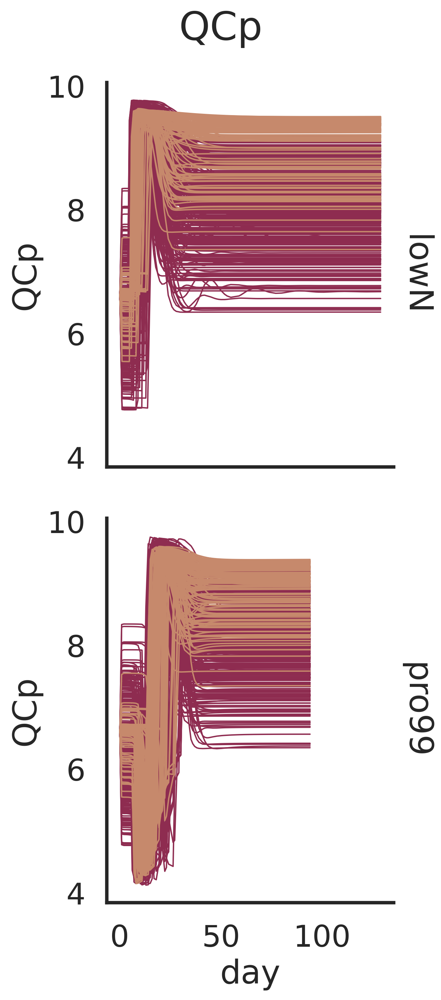

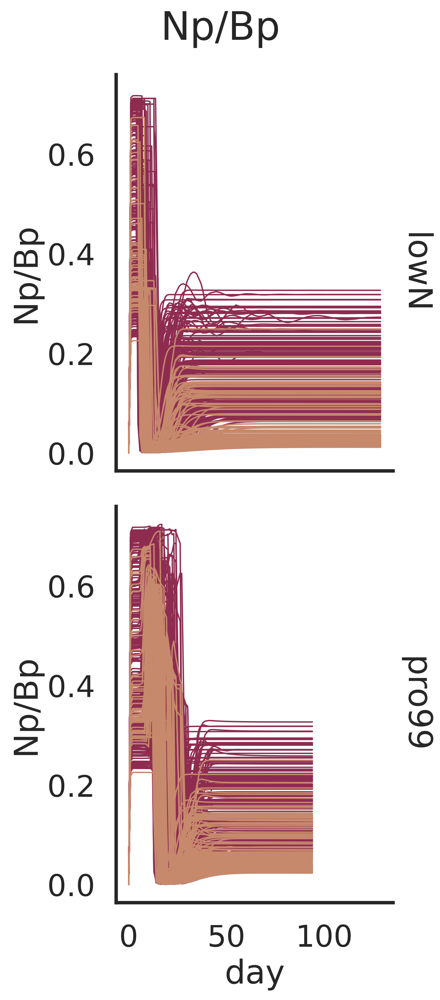

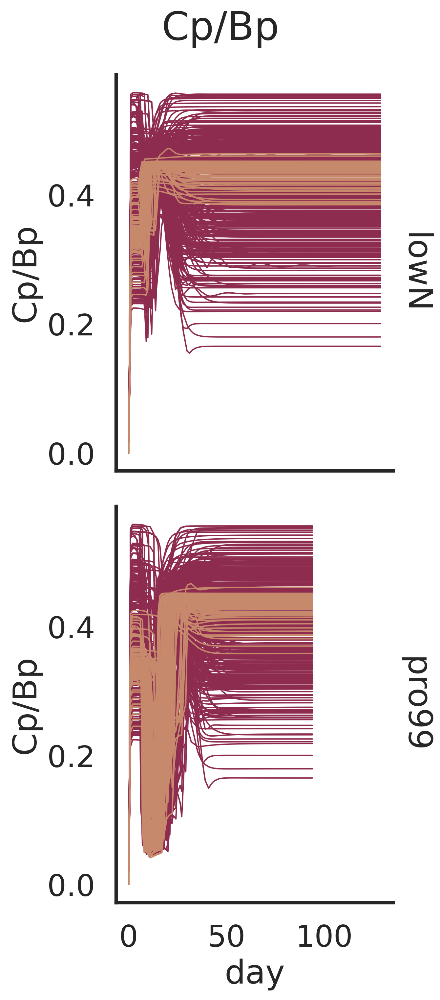

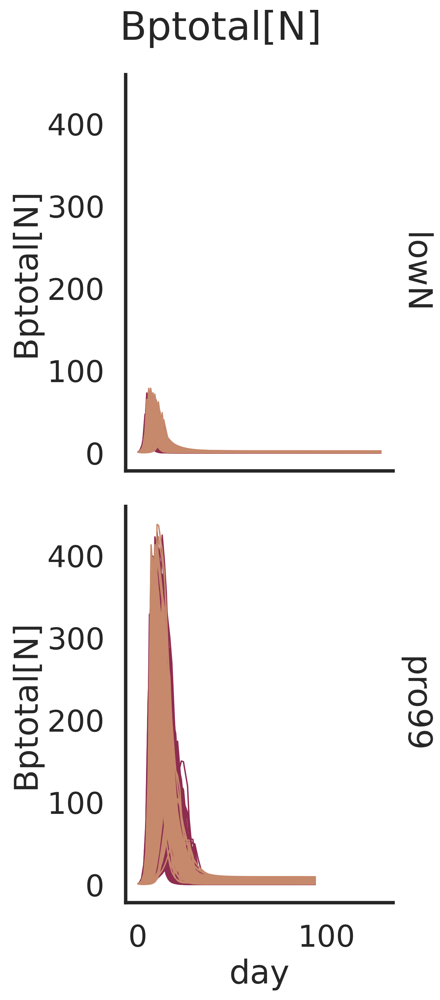

In [216]:
for n in ('QCp', 'Np/Bp','Cp/Bp', 'Bptotal[N]'):
    l= 'RMSE'
    g = sns.relplot(
        data=bestdf,
        kind='line', 
        estimator=None, units='idx',
        x='day', y=n, 
        row='media', row_order=media_order, lw=1,
        #hue='labels', hue_order=corder, palette='Set2',
        hue='model', hue_order=morder, palette=mpalette,
        #col='model', col_order=morder, 
        facet_kws=dict( margin_titles=True),
        legend=False
    )
    #g.set(ylabel=f'{n} biomass (umol/L)')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')
    plt.suptitle(n, y=1.03)

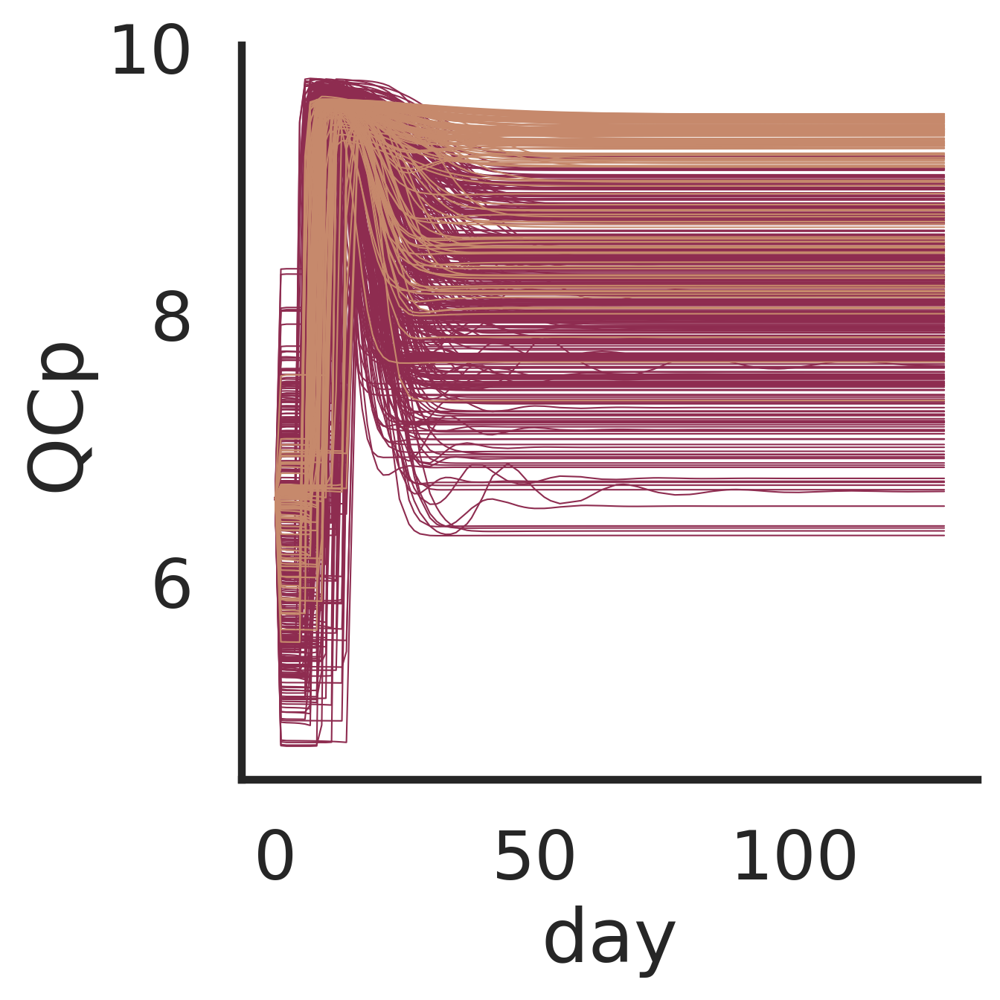

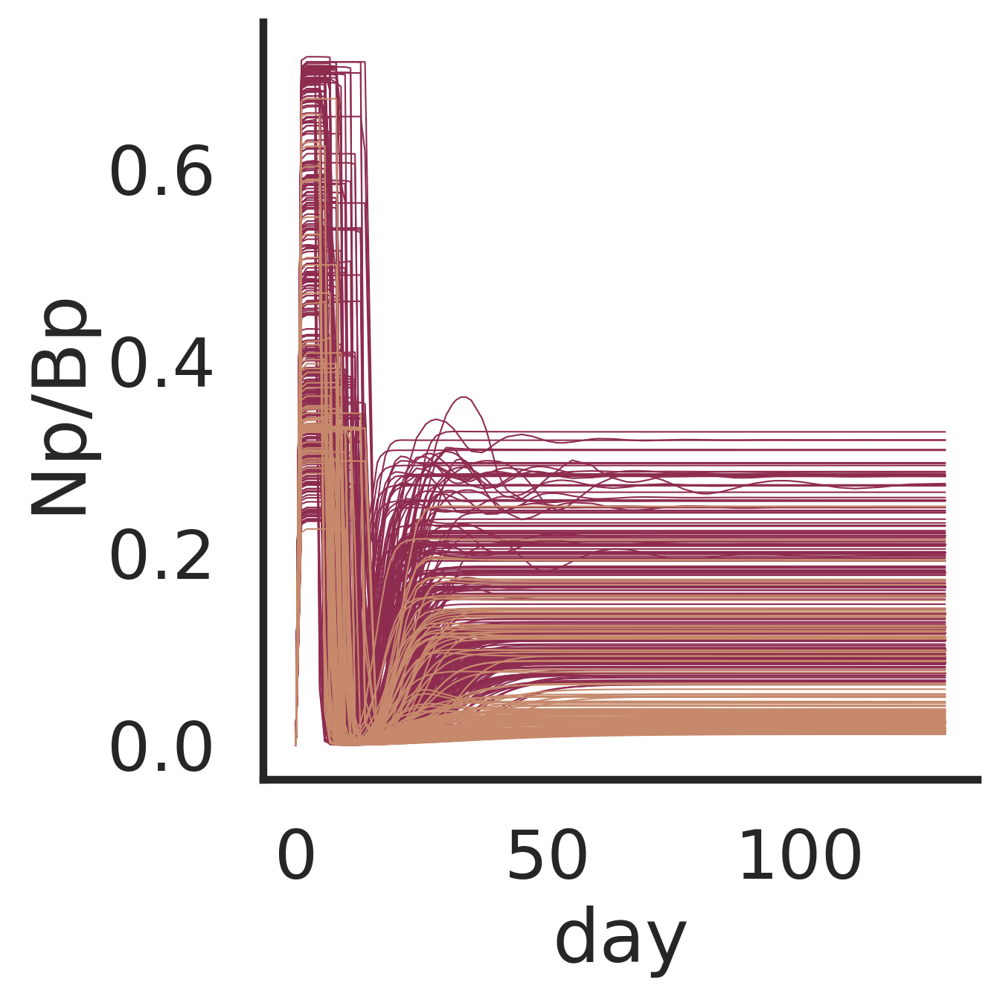

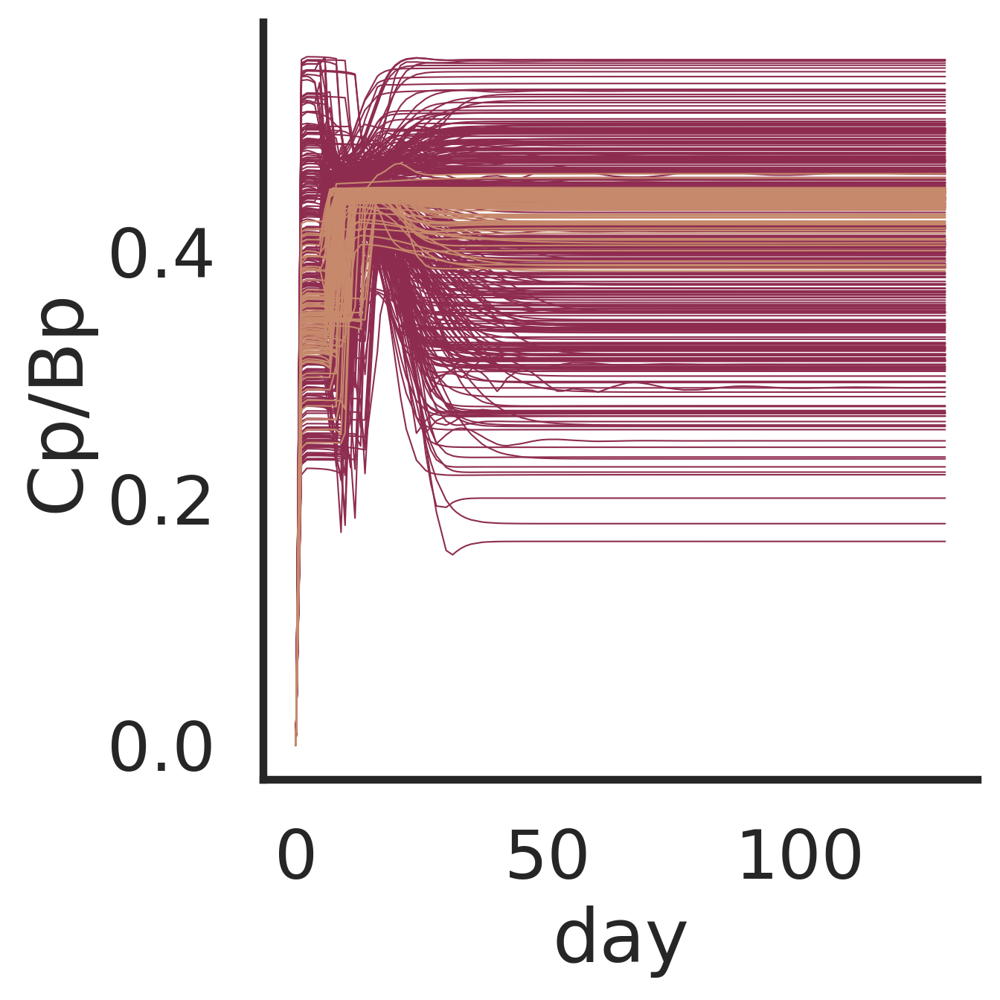

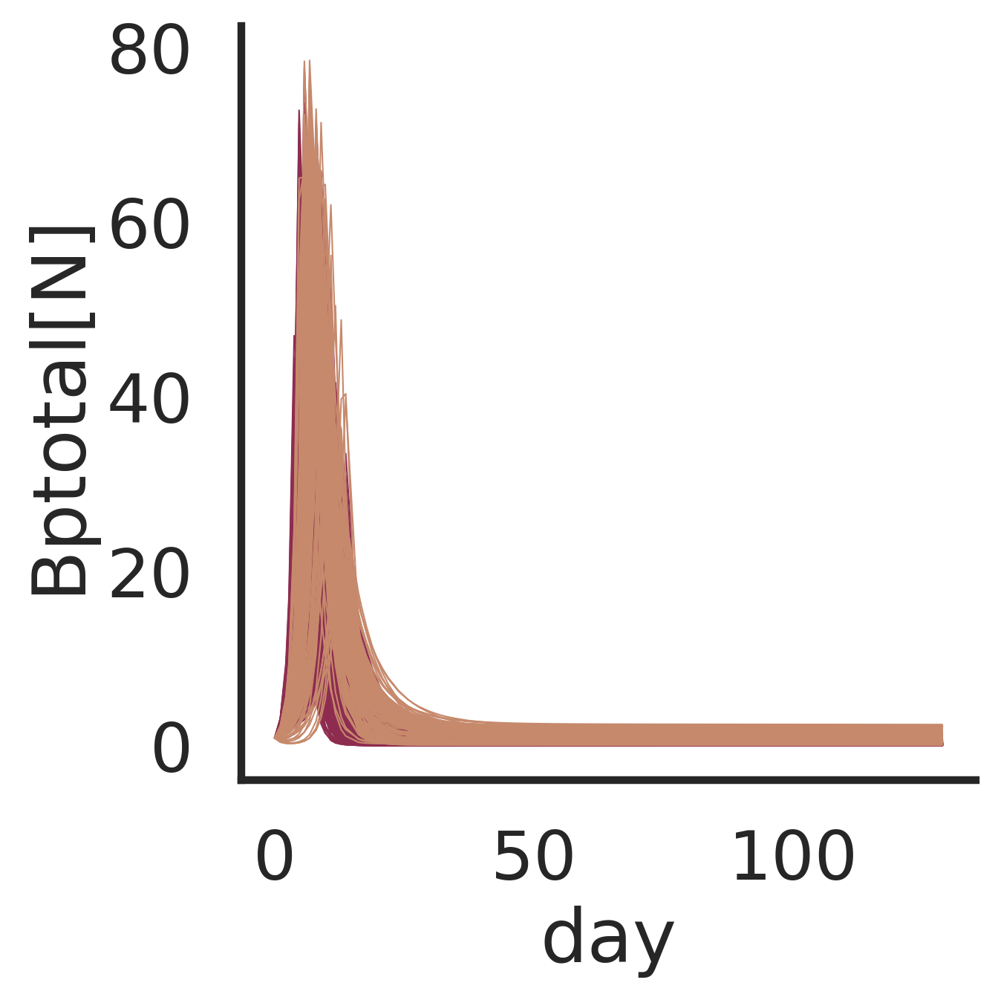

In [217]:
for n in ('QCp', 'Np/Bp','Cp/Bp', 'Bptotal[N]'):
    l= 'RMSE'
    g = sns.relplot(
        data=bestdf.loc[bestdf.media.isin([('lowN')])],
        kind='line', 
        estimator=None, units='idx',
        x='day', y=n, 
                        lw=0.5,
        #hue='labels', hue_order=corder, palette='Set2',
        hue='model', hue_order=morder, palette=mpalette,
        #col='model', col_order=morder, 
        facet_kws=dict( margin_titles=True),
        legend=False
    )
    #g.set(ylabel=f'{n} biomass (umol/L)')
    #g.set_titles(col_template='{col_name}', row_template='{row_name}')
    #plt.suptitle(n, y=1.03)

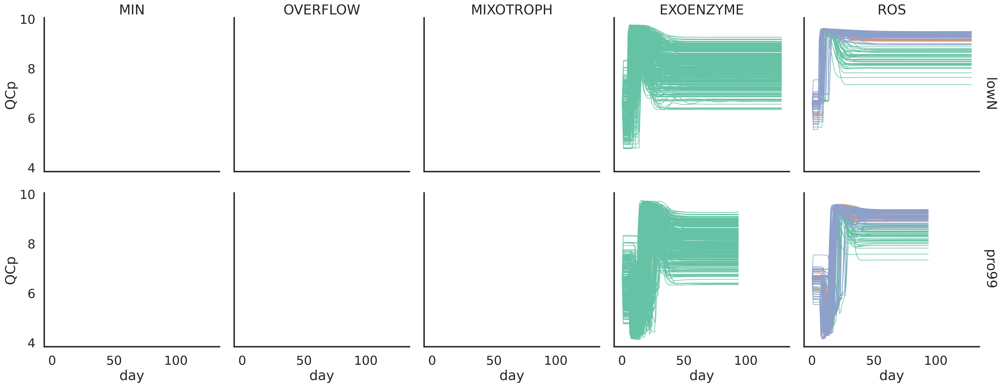

In [218]:

for n in ('N',):
    l= 'RMSE'
    g = sns.relplot(
        data=bestdf,
        kind='line', 
        estimator=None, units='idx',
        x='day', y=f'QCp', 
        row='media', row_order=media_order, lw=1,
        hue='labels', hue_order=corder, palette='Set2',
        col='model', col_order=morder, 
        facet_kws=dict( margin_titles=True),
        legend=False
    )
#     g.set(ylabel=f'{n} biomass (umol/L)')
    g.set_titles(col_template='{col_name}', row_template='{row_name}')
    #plt.suptitle(f'{n} - top models ({l})', y=1.03)

In [219]:
mparams_df['cluster_'] = mparams_df.cluster.fillna('bad fit')

In [220]:
mparams_df.loc[~mparams_df['FC'].isna()].variable.unique()

array(['VmaxICp', 'VmaxINp', 'KICp', 'KINp', 'Mp', 'gammaDp', 'KprodROSp',
       'KlossROSp', 'omegaP'], dtype=object)

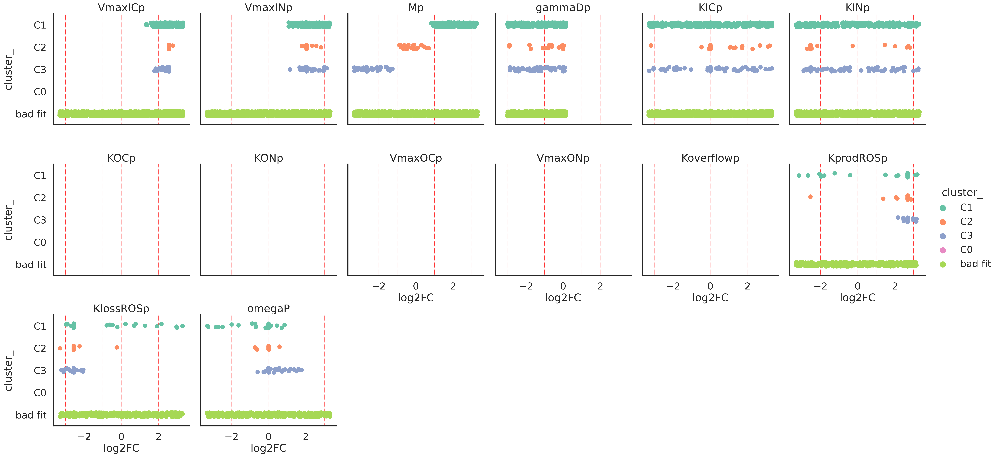

In [221]:
sns.set_context('poster')
corder1 = corder + ['C0', 'bad fit']
porder = ['VmaxICp', 'VmaxINp',  'Mp', 'gammaDp', 'KICp', 'KINp', 'KOCp',
       'KONp', 'VmaxOCp', 'VmaxONp','Koverflowp', 'KprodROSp', 'KlossROSp',
       'omegaP']
g = sns.catplot(
    data=mparams_df.loc[~mparams_df['FC'].isna()].reset_index(), 
    col='variable', x='FC', y='cluster_', col_wrap=6, order=corder1,
    hue='cluster_', hue_order=corder1, palette='Set2', s=100, 
    col_order=porder,
    #dodge=True,
    #legend=False,
).set_titles(col_template='{col_name}', row_template='{row_name}').set(xlabel='log2FC')

for (#row_val,
     col_val), ax in g.axes_dict.items():
    #refmean = refmaxday_df.loc[refmaxday_df['media'].isin([col_val]), col].mean()
    for i in [-3,-2,-1,0,1,2,3]:
        ax.axvline(i, color='red', ls='--', alpha=0.8, lw=0.5)


In [222]:
mtmp1.columns

Index(['model', 'idx', 'VmaxICp', 'VmaxINp', 'Mp', 'labels',
       'log2FC(VmaxINp)/log2FC(Mp)', 'log2FC(VmaxICp)/log2FC(Mp)'],
      dtype='object', name='variable')

In [223]:
mparams_df.loc[
    mparams_df.variable.isin(['VmaxICp', 'VmaxINp', 'Mp',])
    
].pivot_table(index='cluster', columns='variable', values='value', aggfunc=['mean', 'std'])*24*3600

mean                           std                    
variable        Mp   VmaxICp   VmaxINp        Mp   VmaxICp   VmaxINp
cluster                                                             
C1        0.451906  2.845408  2.680338  0.184381  0.810942  1.063081
C2        0.092496  2.852016  2.072761  0.033442  0.087279  0.361142
C3        0.018531  2.754035  2.098844  0.007140  0.246586  0.521623

In [230]:
out_dpath = 'VPRO/ADDITIONAL'
for m in morder:
    os.makedirs(os.path.join(out_dpath, m), exist_ok=True)

In [228]:
cluster_ids.index.str.replace('monte2_ponly_','', regex=False).str.replace('.*_vpro', 'vpro', regex=True)

Index(['vpro__23_67_EXOENZYME_C3__monte__51_EXOENZYME',
       'vpro__23_67_EXOENZYME_C3__monte__94_EXOENZYME',
       'vpro__23_67_EXOENZYME_C3__monte__72_EXOENZYME',
       'vpro__79_6_EXOENZYME_C3__monte__63_EXOENZYME',
       'vpro__13_69_EXOENZYME_C1__monte__80_EXOENZYME',
       'vpro__43_14_EXOENZYME_C3__monte__21_EXOENZYME',
       'vpro__50_15_EXOENZYME_C1__monte__55_EXOENZYME',
       'vpro__88_18_EXOENZYME_C3__monte__81_EXOENZYME',
       'vpro__19_33_ROS_C0_1_monte__32_ROS',
       'vpro__13_69_EXOENZYME_C1__monte__40_EXOENZYME',
       ...
       'vpro__19_33_ROS_C0_10_monte__81_ROS',
       'vpro__19_33_ROS_C0_10_monte__23_ROS',
       'vpro__19_33_ROS_C0_10_monte__41_ROS',
       'vpro__19_33_ROS_C0_10_monte__60_ROS',
       'vpro__19_33_ROS_C0_3_monte__85_ROS',
       'vpro__19_33_ROS_C0_7_monte__72_ROS',
       'vpro__19_33_ROS_C0_8_monte__17_ROS',
       'vpro__19_33_ROS_C0_3_monte__40_ROS',
       'vpro__19_33_ROS_C0_2_monte__99_ROS',
       'vpro__19_33_ROS_C0_7_mon

In [244]:
import re
labeldict = cluster_ids.to_dict()['labels']
for idx in labeldict:
    ser_x = mparams_df.loc[
        mparams_df.idx.isin([idx]) & ~mparams_df.FC.isna(), ['variable', 'value']
    ]
    ser_x.index= ser_x.variable
    actual_finalX = ser_x.value.to_dict()
    vpro_id = idx.replace('monte2_ponly_','') #.replace('_monte__','_')
    vpro_id = re.sub(r'_monte__(\d+)_[^_]+$', r'\1', vpro_id)
    for m in morder:
        vpro_id = vpro_id.replace(f'{m}_','', 1)
        #vpro_id = vpro_id.replace(f'_{m}','')
        pass
    fname = vpro_id
    model = mparams_df.loc[mparams_df.idx.isin([idx])]['model'].unique()[0]
    res_fpath = os.path.join(out_dpath, model, f'{fname}.json')
    print(res_fpath)
    params2json(actual_finalX, res_fpath)


VPRO/ADDITIONAL/EXOENZYME/vpro_23_67_EXOENZYME_C3_51.json
VPRO/ADDITIONAL/EXOENZYME/vpro_23_67_EXOENZYME_C3_94.json
VPRO/ADDITIONAL/EXOENZYME/vpro_23_67_EXOENZYME_C3_72.json
VPRO/ADDITIONAL/EXOENZYME/vpro_79_6_EXOENZYME_C3_63.json
VPRO/ADDITIONAL/EXOENZYME/vpro_13_69_EXOENZYME_C1_80.json
VPRO/ADDITIONAL/EXOENZYME/vpro_43_14_EXOENZYME_C3_21.json
VPRO/ADDITIONAL/EXOENZYME/vpro_50_15_EXOENZYME_C1_55.json
VPRO/ADDITIONAL/EXOENZYME/vpro_88_18_EXOENZYME_C3_81.json
VPRO/ADDITIONAL/ROS/vpro_19_33_ROS_C0_132.json
VPRO/ADDITIONAL/EXOENZYME/vpro_13_69_EXOENZYME_C1_40.json
VPRO/ADDITIONAL/EXOENZYME/vpro_96_67_EXOENZYME_C4_61.json
VPRO/ADDITIONAL/EXOENZYME/vpro_11_62_EXOENZYME_C1_32.json
VPRO/ADDITIONAL/EXOENZYME/vpro_24_46_EXOENZYME_C3_25.json
VPRO/ADDITIONAL/EXOENZYME/vpro_11_62_EXOENZYME_C1_46.json
VPRO/ADDITIONAL/EXOENZYME/vpro_79_6_EXOENZYME_C3_48.json
VPRO/ADDITIONAL/EXOENZYME/vpro_43_14_EXOENZYME_C3_36.json
VPRO/ADDITIONAL/EXOENZYME/vpro_43_14_EXOENZYME_C3_83.json
VPRO/ADDITIONAL/EXOENZYME/v

VPRO/ADDITIONAL/EXOENZYME/vpro_53_82_EXOENZYME_C2_46.json
VPRO/ADDITIONAL/EXOENZYME/vpro_53_82_EXOENZYME_C2_82.json
VPRO/ADDITIONAL/EXOENZYME/vpro_48_16_EXOENZYME_C4_30.json
VPRO/ADDITIONAL/EXOENZYME/vpro_53_82_EXOENZYME_C2_49.json
VPRO/ADDITIONAL/EXOENZYME/vpro_48_16_EXOENZYME_C4_48.json
VPRO/ADDITIONAL/EXOENZYME/vpro_48_16_EXOENZYME_C4_90.json
VPRO/ADDITIONAL/EXOENZYME/vpro_23_76_EXOENZYME_C2_37.json
VPRO/ADDITIONAL/EXOENZYME/vpro_49_52_EXOENZYME_C2_24.json
VPRO/ADDITIONAL/EXOENZYME/vpro_49_52_EXOENZYME_C2_41.json
VPRO/ADDITIONAL/EXOENZYME/vpro_23_76_EXOENZYME_C2_40.json
VPRO/ADDITIONAL/EXOENZYME/vpro_23_76_EXOENZYME_C2_41.json
VPRO/ADDITIONAL/EXOENZYME/vpro_23_76_EXOENZYME_C2_30.json
VPRO/ADDITIONAL/EXOENZYME/vpro_51_71_EXOENZYME_C2_60.json
VPRO/ADDITIONAL/EXOENZYME/vpro_53_82_EXOENZYME_C2_42.json
VPRO/ADDITIONAL/EXOENZYME/vpro_39_73_EXOENZYME_C2_28.json
VPRO/ADDITIONAL/EXOENZYME/vpro_39_73_EXOENZYME_C2_22.json
VPRO/ADDITIONAL/EXOENZYME/vpro_53_82_EXOENZYME_C2_84.json
VPRO/ADDITIONA

VPRO/ADDITIONAL/EXOENZYME/vpro_77_45_EXOENZYME_C3_51.json
VPRO/ADDITIONAL/EXOENZYME/vpro_57_7_EXOENZYME_C2_71.json
VPRO/ADDITIONAL/EXOENZYME/vpro_75_68_EXOENZYME_C2_86.json
VPRO/ADDITIONAL/EXOENZYME/vpro_49_10_EXOENZYME_C3_85.json
VPRO/ADDITIONAL/EXOENZYME/vpro_49_10_EXOENZYME_C3_16.json
VPRO/ADDITIONAL/EXOENZYME/vpro_49_10_EXOENZYME_C3_91.json
VPRO/ADDITIONAL/EXOENZYME/vpro_79_6_EXOENZYME_C3_16.json
VPRO/ADDITIONAL/EXOENZYME/vpro_79_6_EXOENZYME_C3_46.json
VPRO/ADDITIONAL/EXOENZYME/vpro_77_45_EXOENZYME_C3_95.json
VPRO/ADDITIONAL/EXOENZYME/vpro_51_71_EXOENZYME_C2_16.json
VPRO/ADDITIONAL/EXOENZYME/vpro_77_45_EXOENZYME_C3_89.json
VPRO/ADDITIONAL/EXOENZYME/vpro_23_67_EXOENZYME_C3_70.json
VPRO/ADDITIONAL/EXOENZYME/vpro_23_67_EXOENZYME_C3_52.json
VPRO/ADDITIONAL/EXOENZYME/vpro_23_67_EXOENZYME_C3_67.json
VPRO/ADDITIONAL/EXOENZYME/vpro_43_14_EXOENZYME_C3_86.json
VPRO/ADDITIONAL/EXOENZYME/vpro_88_18_EXOENZYME_C3_97.json
VPRO/ADDITIONAL/EXOENZYME/vpro_58_74_EXOENZYME_C1_5.json
VPRO/ADDITIONAL/EX

VPRO/ADDITIONAL/ROS/vpro_19_33_ROS_C0_525.json
VPRO/ADDITIONAL/ROS/vpro_19_33_ROS_C0_520.json
VPRO/ADDITIONAL/ROS/vpro_19_33_ROS_C0_47.json
VPRO/ADDITIONAL/ROS/vpro_19_33_ROS_C0_365.json
VPRO/ADDITIONAL/ROS/vpro_19_33_ROS_C0_32.json
VPRO/ADDITIONAL/ROS/vpro_19_33_ROS_C0_252.json
VPRO/ADDITIONAL/ROS/vpro_19_33_ROS_C0_19.json
VPRO/ADDITIONAL/ROS/vpro_19_33_ROS_C0_186.json
VPRO/ADDITIONAL/ROS/vpro_19_33_ROS_C0_166.json
VPRO/ADDITIONAL/ROS/vpro_19_33_ROS_C0_124.json
VPRO/ADDITIONAL/ROS/vpro_19_33_ROS_C0_1081.json
VPRO/ADDITIONAL/ROS/vpro_19_33_ROS_C0_1023.json
VPRO/ADDITIONAL/ROS/vpro_19_33_ROS_C0_1041.json
VPRO/ADDITIONAL/ROS/vpro_19_33_ROS_C0_1060.json
VPRO/ADDITIONAL/ROS/vpro_19_33_ROS_C0_385.json
VPRO/ADDITIONAL/ROS/vpro_19_33_ROS_C0_772.json
VPRO/ADDITIONAL/ROS/vpro_19_33_ROS_C0_817.json
VPRO/ADDITIONAL/ROS/vpro_19_33_ROS_C0_340.json
VPRO/ADDITIONAL/ROS/vpro_19_33_ROS_C0_299.json
VPRO/ADDITIONAL/ROS/vpro_19_33_ROS_C0_711.json
